In [405]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import matplotlib.colors as color
import matplotlib.cm as cmx
from matplotlib.pyplot import cm
from mpl_toolkits.mplot3d import Axes3D
import time, os, json
from itertools import combinations
import torch
from torch_geometric.utils import from_networkx

'''Data loading'''

file_path = 'C:/Users/Teamaerosal/Desktop/Dissertation DUE 29TH AUG/Essentials for Braille Project/07_03_collect_10_row1_1/events/taps_trial_9_pose_0_events_on.npy'
data = np.load(file_path, allow_pickle = True)
print(data.dtype.names)


#check a single pixel:

for y in range(480):
    for x in range(640):
        if len(data[y][x]) > 0:
            print(f"Pixel ({x}, {y}):", data[y][x])
            break
    else:
        continue
    break
print("The data is an array containing lists. Eaxh pixel has (x,y) values and a [timestamp]") 

None
Pixel (153, 0): [22096]
The data is an array containing lists. Eaxh pixel has (x,y) values and a [timestamp]


In [406]:
#rearrange mapping to time based.

indices = [i for i in np.ndindex(data.shape) if len(data[i]) > 0]

#reverse the mapping:
from collections import defaultdict

#dictionary of timestamps + event indices for values
organized_data = defaultdict(list)

for i in indices:
    for ts in data[i]:
        organized_data[ts].append(i)

#sorted list of timestamps + corresponding coordinates:
sorted_timestamps = sorted(organized_data.keys())
for ts in sorted_timestamps:
    print(f"Timestamp {ts}: Coords {organized_data[ts]}")


Timestamp 10: Coords [(442, 29)]
Timestamp 15: Coords [(441, 29)]
Timestamp 18: Coords [(357, 60)]
Timestamp 20: Coords [(28, 15)]
Timestamp 22: Coords [(52, 389)]
Timestamp 27: Coords [(27, 14)]
Timestamp 28: Coords [(357, 59)]
Timestamp 30: Coords [(384, 405)]
Timestamp 40: Coords [(72, 576), (348, 248), (428, 160)]
Timestamp 41: Coords [(415, 409), (428, 160)]
Timestamp 43: Coords [(71, 577), (427, 160)]
Timestamp 45: Coords [(427, 160)]
Timestamp 46: Coords [(71, 577)]
Timestamp 48: Coords [(71, 577)]
Timestamp 54: Coords [(244, 601), (334, 108)]
Timestamp 59: Coords [(428, 160)]
Timestamp 60: Coords [(71, 577)]
Timestamp 61: Coords [(71, 577), (375, 385)]
Timestamp 72: Coords [(69, 389), (69, 390)]
Timestamp 74: Coords [(69, 389)]
Timestamp 77: Coords [(69, 389)]
Timestamp 78: Coords [(69, 389)]
Timestamp 79: Coords [(69, 389)]
Timestamp 80: Coords [(69, 389)]
Timestamp 81: Coords [(69, 389), (69, 389)]
Timestamp 85: Coords [(58, 326)]
Timestamp 87: Coords [(59, 327)]
Timestamp 91

In [407]:
import pandas as pd

#flatten organized_data into list of dicts
rows = []
for ts, coords in organized_data.items():
    for x, y in coords:
        rows.append({'timestamp': ts, 'x': x, 'y': y})

df = pd.DataFrame(rows)

df_sorted = df.sort_values('timestamp')

#show first few rows
print(df_sorted.head())

#show summary
print(df_sorted.info())

        timestamp    x    y
172891         10  442   29
172392         15  441   29
147683         18  357   60
16598          20   28   15
25000          22   52  389
<class 'pandas.core.frame.DataFrame'>
Index: 176486 entries, 172891 to 176193
Data columns (total 3 columns):
 #   Column     Non-Null Count   Dtype
---  ------     --------------   -----
 0   timestamp  176486 non-null  int64
 1   x          176486 non-null  int64
 2   y          176486 non-null  int64
dtypes: int64(3)
memory usage: 5.4 MB
None


Data Labeling + Binning + Spike Count Diagrams:


===== Letter A =====
Bin starting at 10ms: 3 coordinates
  Sample coords: [{'timestamp': 10, 'x': 442, 'y': 29}, {'timestamp': 15, 'x': 441, 'y': 29}, {'timestamp': 18, 'x': 357, 'y': 60}]
Bin starting at 20ms: 4 coordinates
  Sample coords: [{'timestamp': 20, 'x': 28, 'y': 15}, {'timestamp': 22, 'x': 52, 'y': 389}, {'timestamp': 27, 'x': 27, 'y': 14}]
Bin starting at 30ms: 1 coordinates
  Sample coords: [{'timestamp': 30, 'x': 384, 'y': 405}]
Bin starting at 40ms: 10 coordinates
  Sample coords: [{'timestamp': 40, 'x': 428, 'y': 160}, {'timestamp': 40, 'x': 348, 'y': 248}, {'timestamp': 40, 'x': 72, 'y': 576}]
Bin starting at 50ms: 3 coordinates
  Sample coords: [{'timestamp': 54, 'x': 244, 'y': 601}, {'timestamp': 54, 'x': 334, 'y': 108}, {'timestamp': 59, 'x': 428, 'y': 160}]
Bin 0: 3 Events
Bin 1: 4 Events
Bin 2: 1 Events
Bin 3: 10 Events
Bin 4: 3 Events
Bin 5: 3 Events
Bin 6: 6 Events
Bin 7: 5 Events
Bin 8: 1 Events
Bin 9: 1 Events
Bin 10: 3 Events
Bin 11: 4 Events
Bin 12: 5 Even

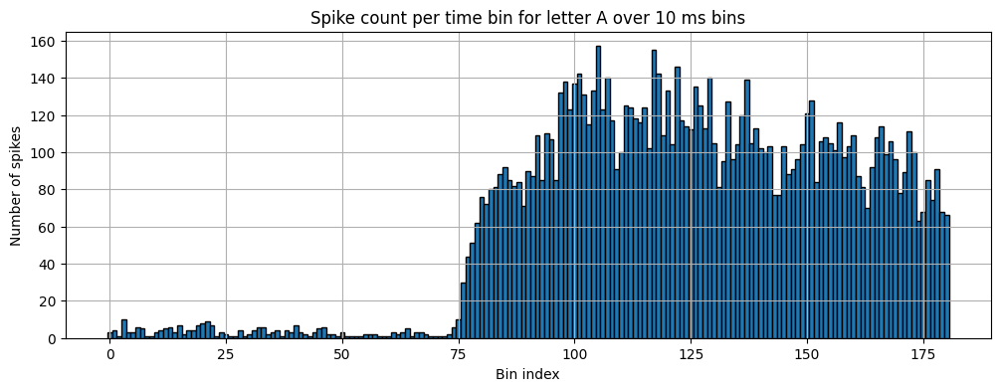

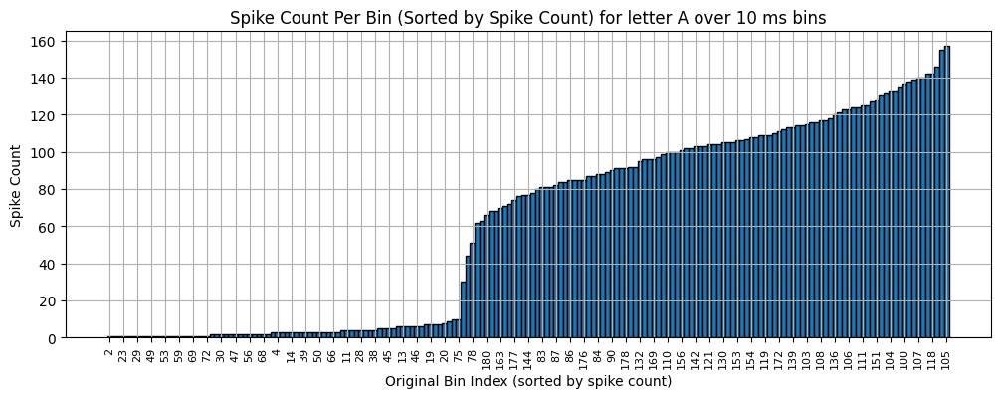


===== Letter B =====
Bin starting at 1910ms: 1 coordinates
  Sample coords: [{'timestamp': 1919, 'x': 73, 'y': 408}]
Bin starting at 1920ms: 81 coordinates
  Sample coords: [{'timestamp': 1920, 'x': 67, 'y': 413}, {'timestamp': 1920, 'x': 68, 'y': 400}, {'timestamp': 1920, 'x': 68, 'y': 412}]
Bin starting at 1930ms: 62 coordinates
  Sample coords: [{'timestamp': 1930, 'x': 115, 'y': 461}, {'timestamp': 1930, 'x': 121, 'y': 434}, {'timestamp': 1930, 'x': 60, 'y': 401}]
Bin starting at 1940ms: 91 coordinates
  Sample coords: [{'timestamp': 1940, 'x': 44, 'y': 377}, {'timestamp': 1940, 'x': 55, 'y': 407}, {'timestamp': 1940, 'x': 59, 'y': 409}]
Bin starting at 1950ms: 89 coordinates
  Sample coords: [{'timestamp': 1950, 'x': 67, 'y': 406}, {'timestamp': 1950, 'x': 92, 'y': 421}, {'timestamp': 1950, 'x': 95, 'y': 448}]
Bin 0: 1 Events
Bin 1: 81 Events
Bin 2: 62 Events
Bin 3: 91 Events
Bin 4: 89 Events
Bin 5: 73 Events
Bin 6: 51 Events
Bin 7: 65 Events
Bin 8: 79 Events
Bin 9: 54 Events
Bin

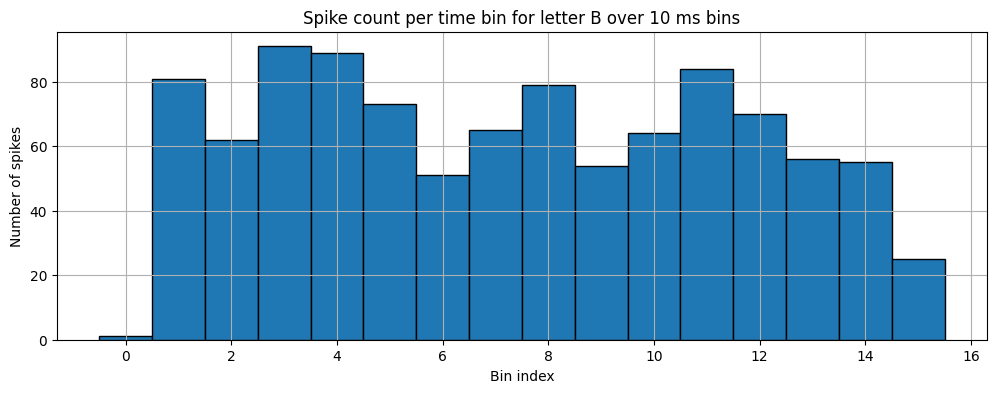

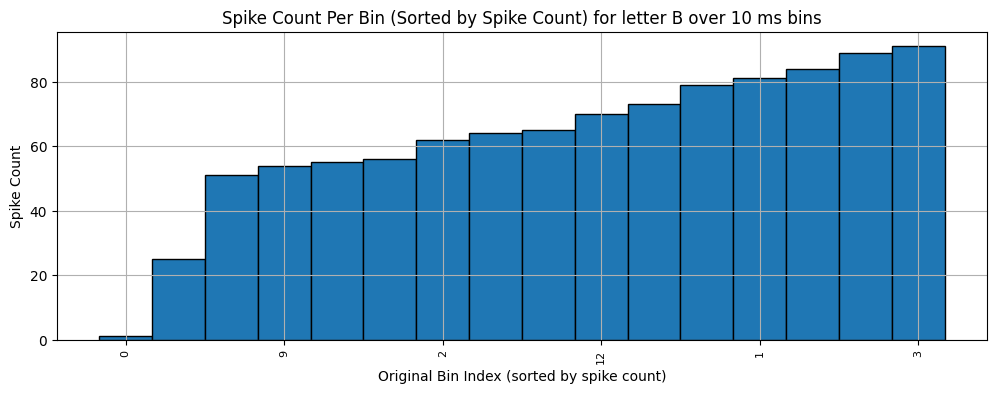


===== Letter C =====
Bin starting at 2060ms: 56 coordinates
  Sample coords: [{'timestamp': 2063, 'x': 4, 'y': 403}, {'timestamp': 2063, 'x': 7, 'y': 414}, {'timestamp': 2063, 'x': 13, 'y': 402}]
Bin starting at 2070ms: 52 coordinates
  Sample coords: [{'timestamp': 2070, 'x': 12, 'y': 410}, {'timestamp': 2070, 'x': 34, 'y': 438}, {'timestamp': 2070, 'x': 11, 'y': 414}]
Bin starting at 2080ms: 64 coordinates
  Sample coords: [{'timestamp': 2080, 'x': 10, 'y': 414}, {'timestamp': 2080, 'x': 3, 'y': 411}, {'timestamp': 2080, 'x': 1, 'y': 436}]
Bin starting at 2090ms: 35 coordinates
  Sample coords: [{'timestamp': 2090, 'x': 10, 'y': 389}, {'timestamp': 2090, 'x': 1, 'y': 402}, {'timestamp': 2090, 'x': 31, 'y': 440}]
Bin starting at 2100ms: 39 coordinates
  Sample coords: [{'timestamp': 2100, 'x': 1, 'y': 411}, {'timestamp': 2100, 'x': 441, 'y': 29}, {'timestamp': 2100, 'x': 19, 'y': 443}]
Bin 0: 56 Events
Bin 1: 52 Events
Bin 2: 64 Events
Bin 3: 35 Events
Bin 4: 39 Events
Bin 5: 21 Even

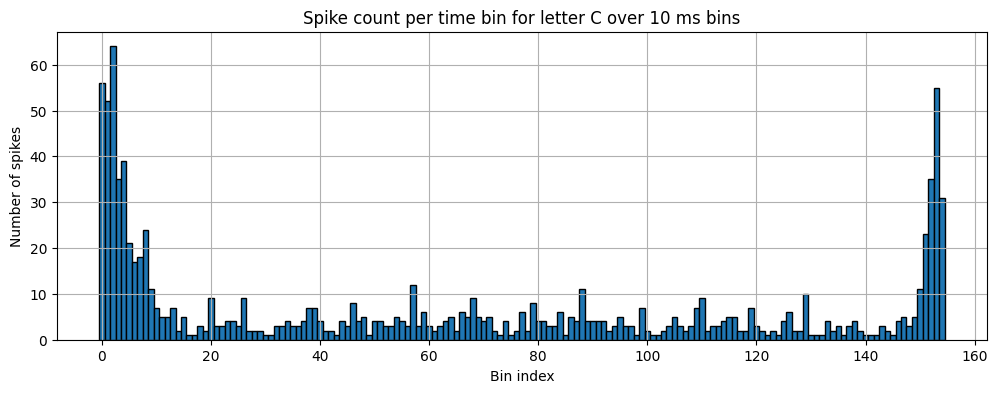

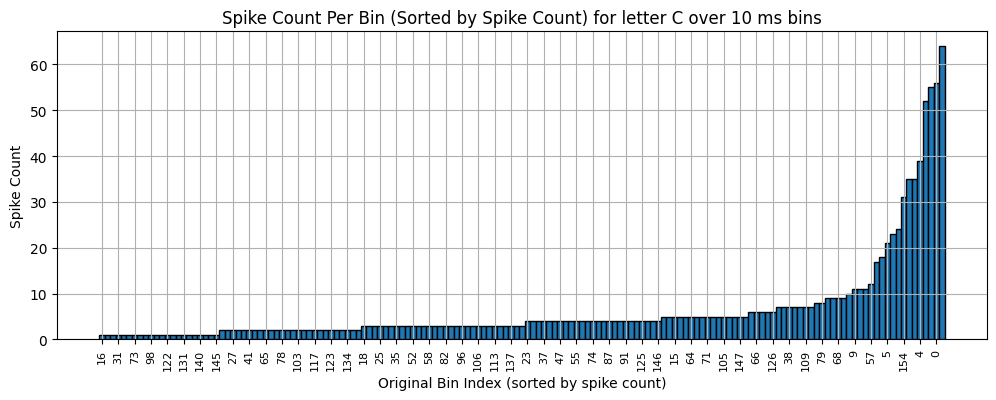


===== Letter D =====
Bin starting at 3760ms: 55 coordinates
  Sample coords: [{'timestamp': 3764, 'x': 467, 'y': 256}, {'timestamp': 3764, 'x': 470, 'y': 266}, {'timestamp': 3764, 'x': 477, 'y': 395}]
Bin starting at 3770ms: 108 coordinates
  Sample coords: [{'timestamp': 3770, 'x': 471, 'y': 403}, {'timestamp': 3770, 'x': 475, 'y': 247}, {'timestamp': 3770, 'x': 478, 'y': 246}]
Bin starting at 3780ms: 110 coordinates
  Sample coords: [{'timestamp': 3780, 'x': 467, 'y': 245}, {'timestamp': 3780, 'x': 455, 'y': 258}, {'timestamp': 3780, 'x': 447, 'y': 255}]
Bin starting at 3790ms: 111 coordinates
  Sample coords: [{'timestamp': 3790, 'x': 456, 'y': 258}, {'timestamp': 3790, 'x': 457, 'y': 393}, {'timestamp': 3790, 'x': 459, 'y': 384}]
Bin starting at 3800ms: 113 coordinates
  Sample coords: [{'timestamp': 3800, 'x': 455, 'y': 388}, {'timestamp': 3800, 'x': 457, 'y': 271}, {'timestamp': 3800, 'x': 459, 'y': 386}]
Bin 0: 55 Events
Bin 1: 108 Events
Bin 2: 110 Events
Bin 3: 111 Events
Bin

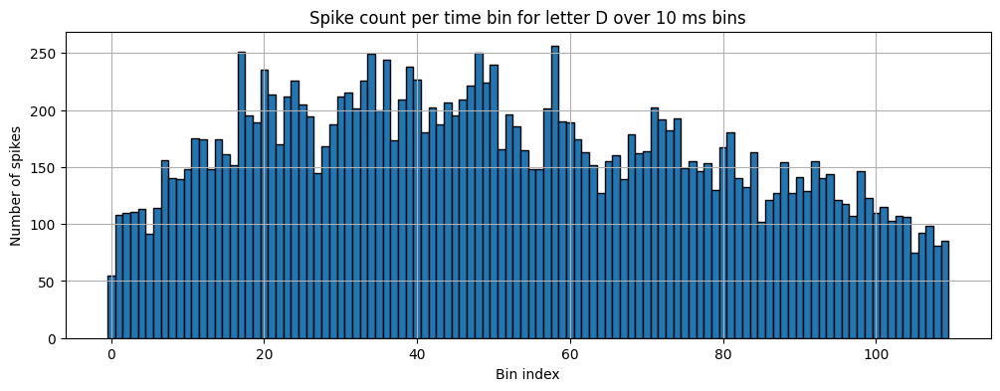

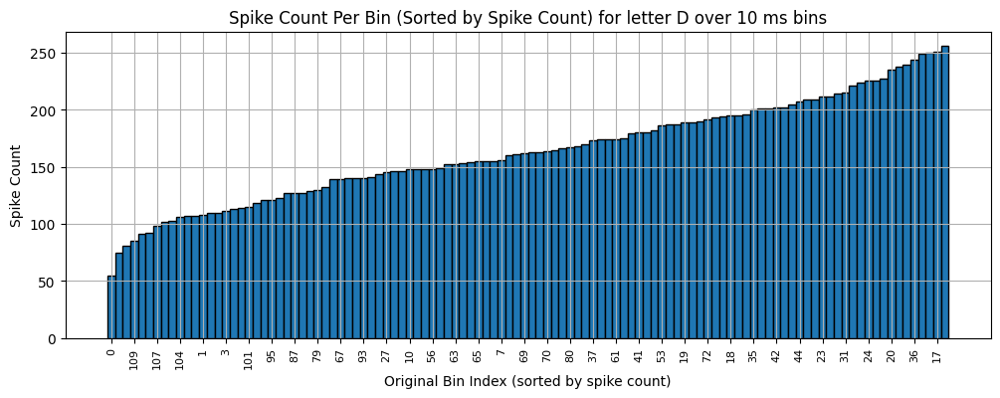


===== Letter E =====
Bin starting at 4850ms: 39 coordinates
  Sample coords: [{'timestamp': 4857, 'x': 54, 'y': 382}, {'timestamp': 4857, 'x': 59, 'y': 425}, {'timestamp': 4857, 'x': 63, 'y': 295}]
Bin starting at 4860ms: 114 coordinates
  Sample coords: [{'timestamp': 4860, 'x': 29, 'y': 231}, {'timestamp': 4860, 'x': 129, 'y': 423}, {'timestamp': 4860, 'x': 31, 'y': 414}]
Bin starting at 4870ms: 100 coordinates
  Sample coords: [{'timestamp': 4870, 'x': 34, 'y': 378}, {'timestamp': 4870, 'x': 35, 'y': 386}, {'timestamp': 4870, 'x': 31, 'y': 254}]
Bin starting at 4880ms: 106 coordinates
  Sample coords: [{'timestamp': 4880, 'x': 30, 'y': 388}, {'timestamp': 4880, 'x': 35, 'y': 254}, {'timestamp': 4880, 'x': 41, 'y': 244}]
Bin starting at 4890ms: 91 coordinates
  Sample coords: [{'timestamp': 4890, 'x': 113, 'y': 435}, {'timestamp': 4890, 'x': 92, 'y': 419}, {'timestamp': 4890, 'x': 59, 'y': 436}]
Bin 0: 39 Events
Bin 1: 114 Events
Bin 2: 100 Events
Bin 3: 106 Events
Bin 4: 91 Events


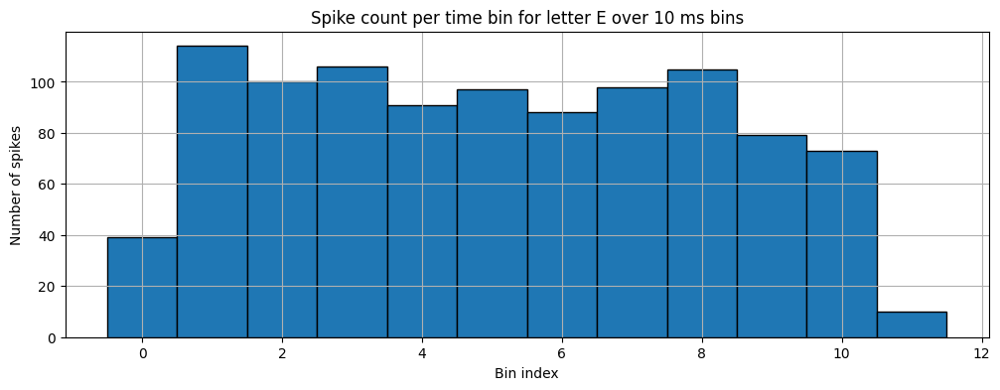

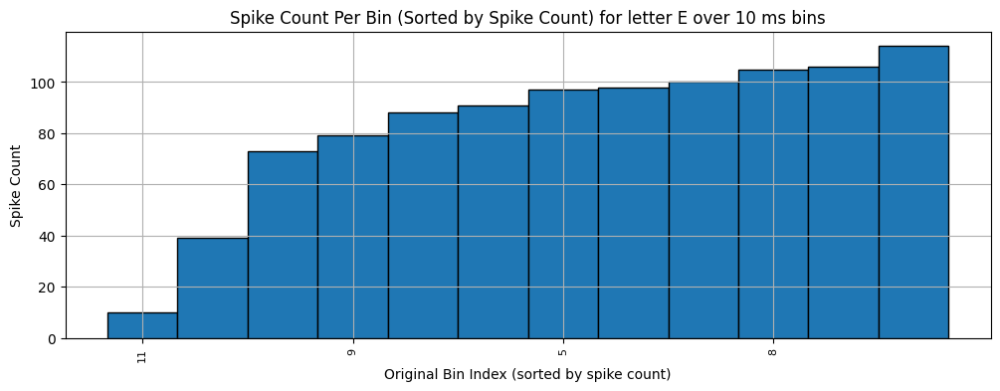


===== Letter F =====
Bin starting at 4960ms: 59 coordinates
  Sample coords: [{'timestamp': 4961, 'x': 11, 'y': 416}, {'timestamp': 4961, 'x': 28, 'y': 416}, {'timestamp': 4961, 'x': 25, 'y': 418}]
Bin starting at 4970ms: 62 coordinates
  Sample coords: [{'timestamp': 4970, 'x': 244, 'y': 600}, {'timestamp': 4970, 'x': 39, 'y': 285}, {'timestamp': 4970, 'x': 35, 'y': 289}]
Bin starting at 4980ms: 44 coordinates
  Sample coords: [{'timestamp': 4980, 'x': 8, 'y': 286}, {'timestamp': 4980, 'x': 23, 'y': 284}, {'timestamp': 4981, 'x': 39, 'y': 428}]
Bin starting at 4990ms: 43 coordinates
  Sample coords: [{'timestamp': 4990, 'x': 2, 'y': 419}, {'timestamp': 4990, 'x': 4, 'y': 283}, {'timestamp': 4990, 'x': 21, 'y': 416}]
Bin starting at 5000ms: 40 coordinates
  Sample coords: [{'timestamp': 5000, 'x': 16, 'y': 423}, {'timestamp': 5000, 'x': 135, 'y': 426}, {'timestamp': 5000, 'x': 14, 'y': 292}]
Bin 0: 59 Events
Bin 1: 62 Events
Bin 2: 44 Events
Bin 3: 43 Events
Bin 4: 40 Events
Bin 5: 30

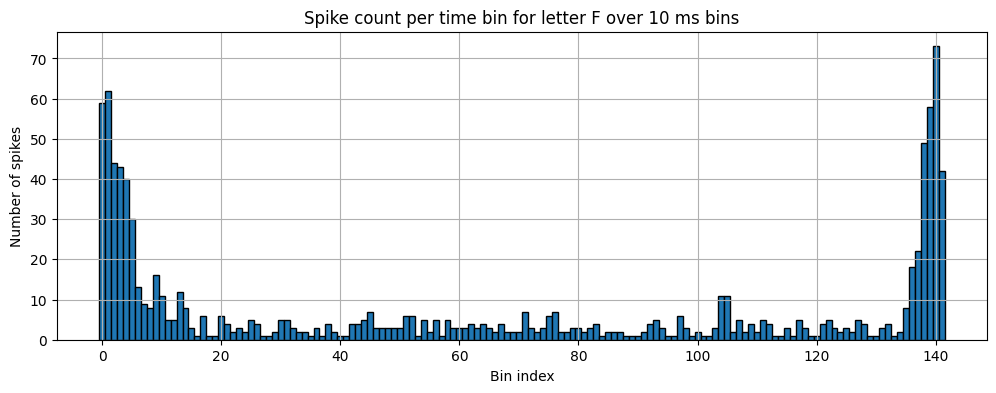

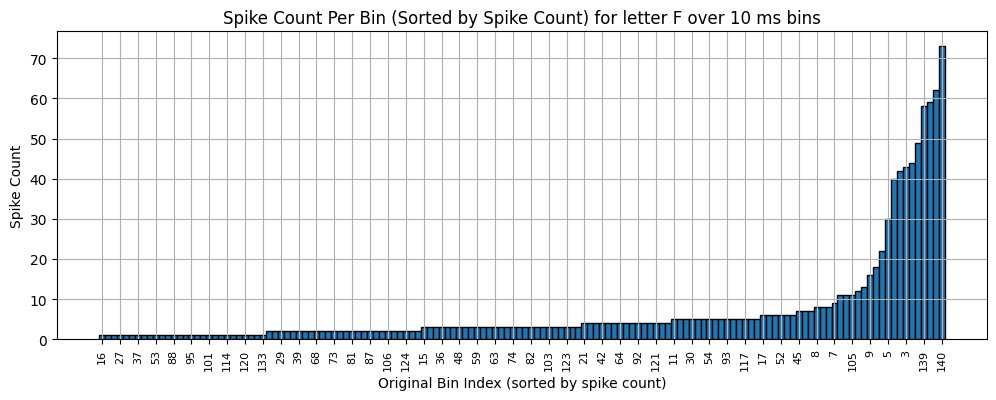


===== Letter G =====
Bin starting at 6630ms: 13 coordinates
  Sample coords: [{'timestamp': 6637, 'x': 459, 'y': 378}, {'timestamp': 6637, 'x': 466, 'y': 378}, {'timestamp': 6638, 'x': 470, 'y': 383}]
Bin starting at 6640ms: 59 coordinates
  Sample coords: [{'timestamp': 6640, 'x': 460, 'y': 379}, {'timestamp': 6640, 'x': 463, 'y': 402}, {'timestamp': 6640, 'x': 460, 'y': 382}]
Bin starting at 6650ms: 52 coordinates
  Sample coords: [{'timestamp': 6650, 'x': 466, 'y': 385}, {'timestamp': 6650, 'x': 459, 'y': 380}, {'timestamp': 6650, 'x': 461, 'y': 387}]
Bin starting at 6660ms: 67 coordinates
  Sample coords: [{'timestamp': 6660, 'x': 447, 'y': 335}, {'timestamp': 6660, 'x': 448, 'y': 357}, {'timestamp': 6660, 'x': 449, 'y': 377}]
Bin starting at 6670ms: 71 coordinates
  Sample coords: [{'timestamp': 6670, 'x': 448, 'y': 364}, {'timestamp': 6670, 'x': 456, 'y': 362}, {'timestamp': 6670, 'x': 460, 'y': 361}]
Bin 0: 13 Events
Bin 1: 59 Events
Bin 2: 52 Events
Bin 3: 67 Events
Bin 4: 71 

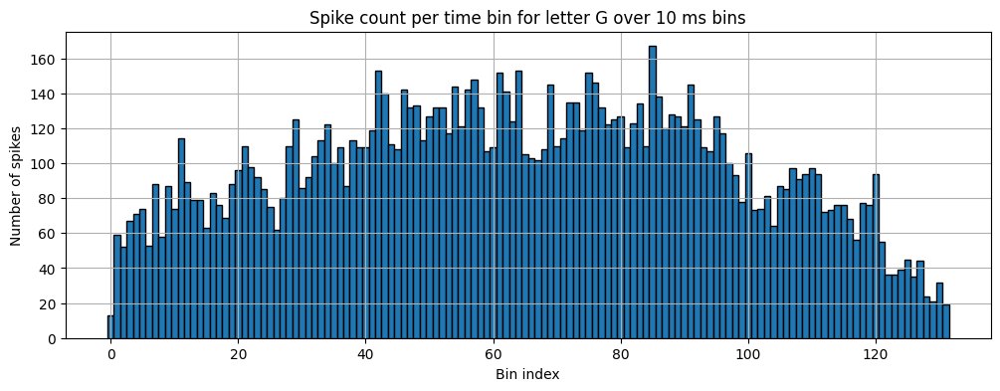

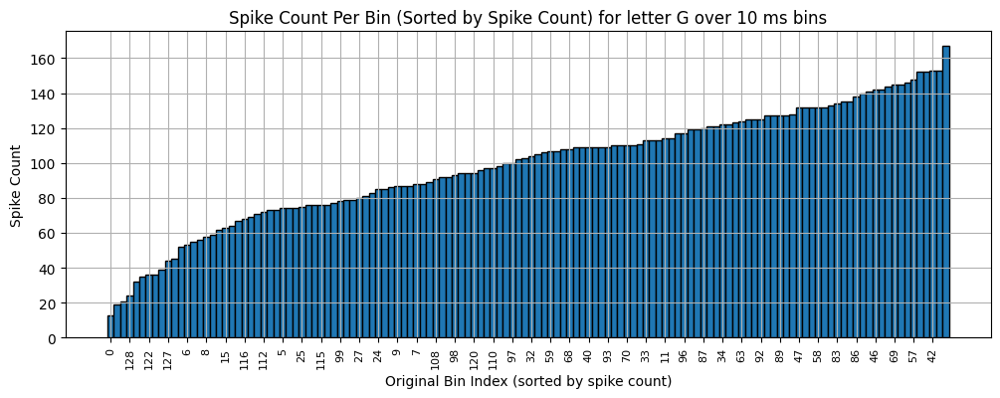


===== Letter H =====
Bin starting at 7940ms: 6 coordinates
  Sample coords: [{'timestamp': 7947, 'x': 187, 'y': 407}, {'timestamp': 7947, 'x': 93, 'y': 403}, {'timestamp': 7948, 'x': 96, 'y': 406}]
Bin starting at 7950ms: 28 coordinates
  Sample coords: [{'timestamp': 7950, 'x': 65, 'y': 371}, {'timestamp': 7950, 'x': 90, 'y': 406}, {'timestamp': 7950, 'x': 91, 'y': 406}]
Bin starting at 7960ms: 29 coordinates
  Sample coords: [{'timestamp': 7960, 'x': 114, 'y': 410}, {'timestamp': 7960, 'x': 378, 'y': 268}, {'timestamp': 7960, 'x': 97, 'y': 398}]
Bin starting at 7970ms: 30 coordinates
  Sample coords: [{'timestamp': 7970, 'x': 147, 'y': 413}, {'timestamp': 7970, 'x': 90, 'y': 404}, {'timestamp': 7971, 'x': 427, 'y': 160}]
Bin starting at 7980ms: 20 coordinates
  Sample coords: [{'timestamp': 7980, 'x': 157, 'y': 414}, {'timestamp': 7980, 'x': 99, 'y': 396}, {'timestamp': 7980, 'x': 93, 'y': 403}]
Bin 0: 6 Events
Bin 1: 28 Events
Bin 2: 29 Events
Bin 3: 30 Events
Bin 4: 20 Events
Bin 

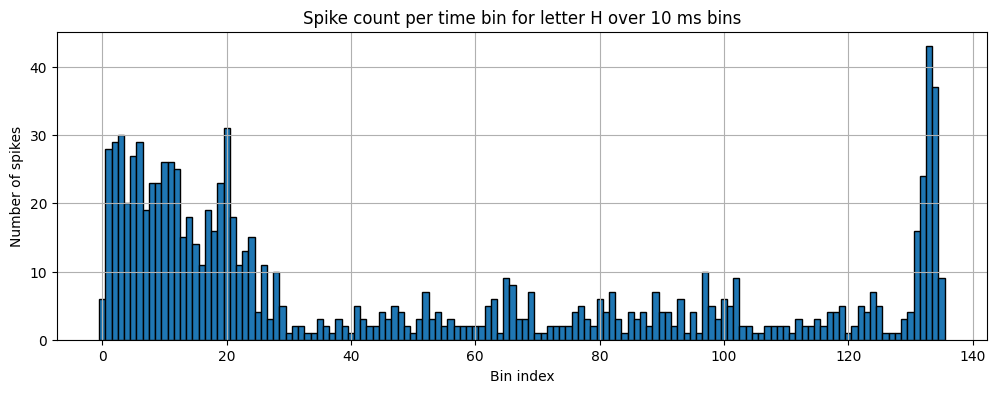

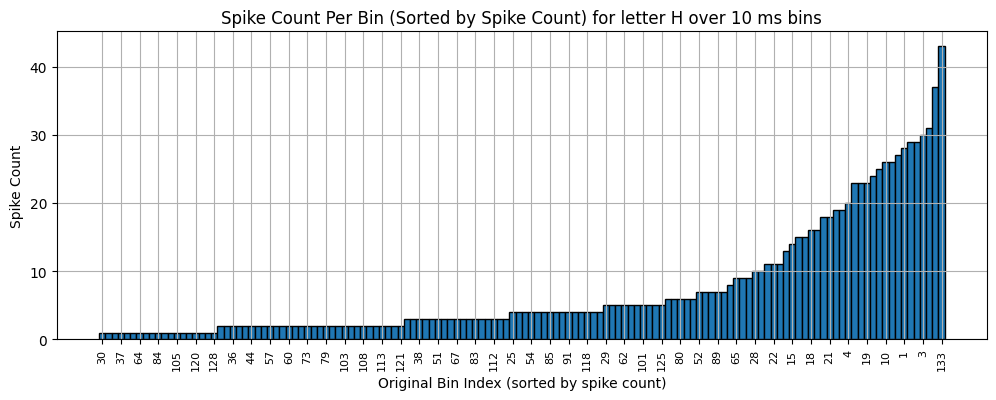


===== Letter I =====
Bin starting at 9480ms: 44 coordinates
  Sample coords: [{'timestamp': 9483, 'x': 467, 'y': 368}, {'timestamp': 9483, 'x': 463, 'y': 359}, {'timestamp': 9483, 'x': 470, 'y': 357}]
Bin starting at 9490ms: 44 coordinates
  Sample coords: [{'timestamp': 9490, 'x': 472, 'y': 362}, {'timestamp': 9490, 'x': 461, 'y': 361}, {'timestamp': 9490, 'x': 463, 'y': 355}]
Bin starting at 9500ms: 32 coordinates
  Sample coords: [{'timestamp': 9500, 'x': 470, 'y': 332}, {'timestamp': 9500, 'x': 461, 'y': 359}, {'timestamp': 9500, 'x': 459, 'y': 360}]
Bin starting at 9510ms: 48 coordinates
  Sample coords: [{'timestamp': 9510, 'x': 96, 'y': 441}, {'timestamp': 9510, 'x': 457, 'y': 364}, {'timestamp': 9510, 'x': 460, 'y': 356}]
Bin starting at 9520ms: 41 coordinates
  Sample coords: [{'timestamp': 9520, 'x': 441, 'y': 356}, {'timestamp': 9521, 'x': 443, 'y': 357}, {'timestamp': 9521, 'x': 455, 'y': 348}]
Bin 0: 44 Events
Bin 1: 44 Events
Bin 2: 32 Events
Bin 3: 48 Events
Bin 4: 41 E

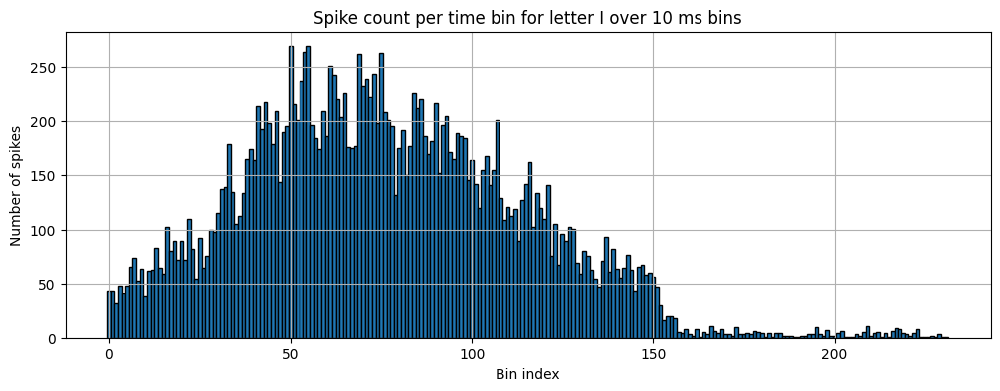

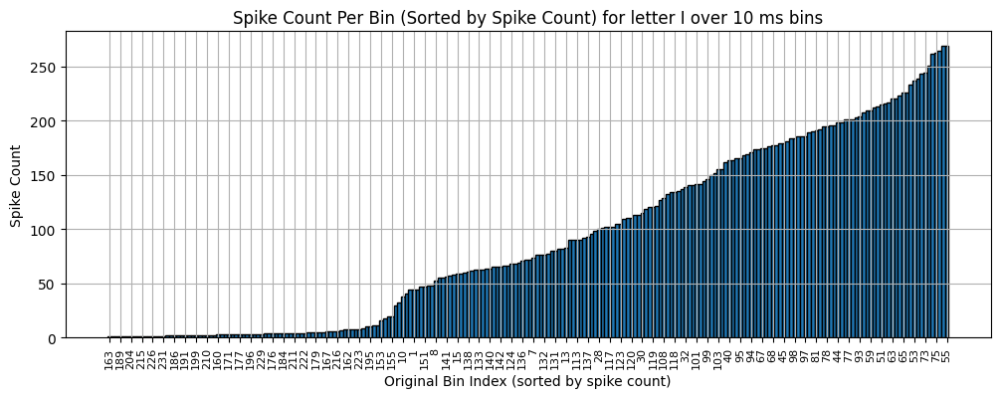


===== Letter J =====
Bin starting at 11880ms: 1 coordinates
  Sample coords: [{'timestamp': 11887, 'x': 27, 'y': 14}]
Bin starting at 11900ms: 2 coordinates
  Sample coords: [{'timestamp': 11902, 'x': 265, 'y': 61}, {'timestamp': 11903, 'x': 266, 'y': 61}]
Bin starting at 11930ms: 2 coordinates
  Sample coords: [{'timestamp': 11931, 'x': 377, 'y': 269}, {'timestamp': 11936, 'x': 27, 'y': 14}]
Bin starting at 11940ms: 3 coordinates
  Sample coords: [{'timestamp': 11940, 'x': 72, 'y': 576}, {'timestamp': 11941, 'x': 71, 'y': 577}, {'timestamp': 11946, 'x': 71, 'y': 577}]
Bin starting at 11950ms: 3 coordinates
  Sample coords: [{'timestamp': 11952, 'x': 284, 'y': 47}, {'timestamp': 11955, 'x': 27, 'y': 14}, {'timestamp': 11958, 'x': 71, 'y': 577}]
Bin 0: 1 Events
Bin 1: 2 Events
Bin 2: 2 Events
Bin 3: 3 Events
Bin 4: 3 Events
Bin 5: 1 Events
Bin 6: 6 Events
Bin 7: 2 Events
Bin 8: 2 Events
Bin 9: 2 Events
Bin 10: 1 Events
Bin 11: 5 Events
Bin 12: 4 Events
Bin 13: 3 Events
Bin 14: 4 Events

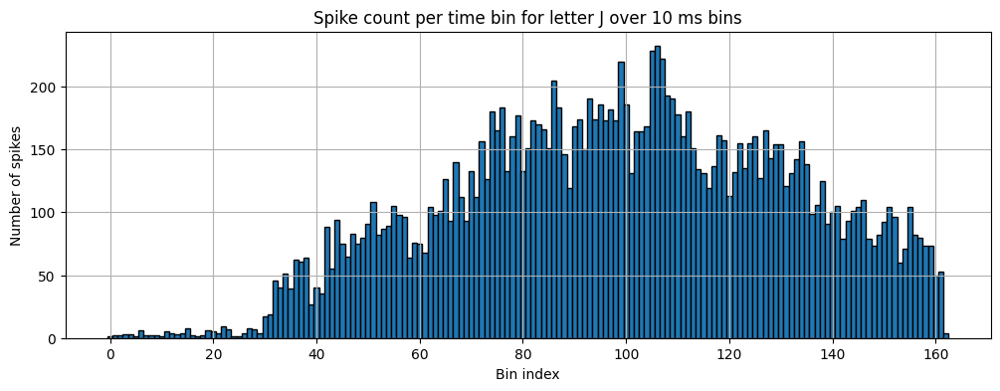

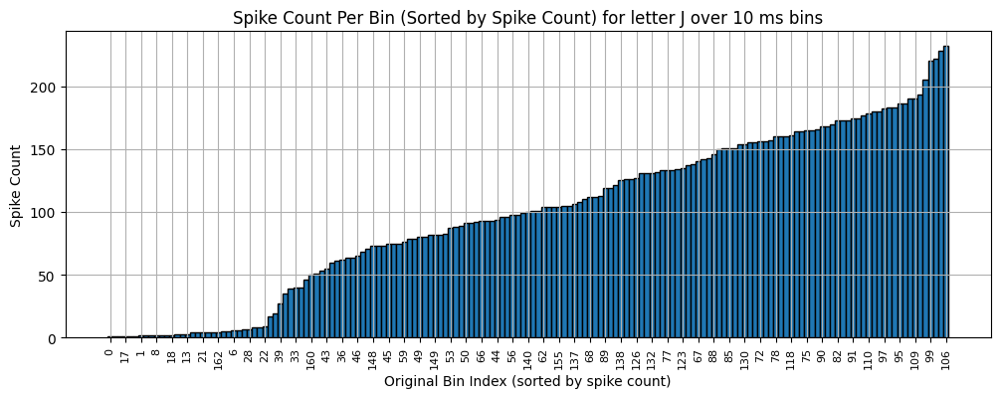


===== Letter Letter_10 =====
Bin starting at 13610ms: 76 coordinates
  Sample coords: [{'timestamp': 13610, 'x': 125, 'y': 244}, {'timestamp': 13610, 'x': 165, 'y': 259}, {'timestamp': 13610, 'x': 146, 'y': 262}]
Bin starting at 13620ms: 50 coordinates
  Sample coords: [{'timestamp': 13620, 'x': 121, 'y': 228}, {'timestamp': 13620, 'x': 121, 'y': 244}, {'timestamp': 13620, 'x': 112, 'y': 235}]
Bin starting at 13630ms: 38 coordinates
  Sample coords: [{'timestamp': 13630, 'x': 79, 'y': 209}, {'timestamp': 13630, 'x': 121, 'y': 239}, {'timestamp': 13631, 'x': 145, 'y': 227}]
Bin starting at 13640ms: 40 coordinates
  Sample coords: [{'timestamp': 13640, 'x': 97, 'y': 237}, {'timestamp': 13640, 'x': 103, 'y': 238}, {'timestamp': 13640, 'x': 111, 'y': 234}]
Bin starting at 13650ms: 55 coordinates
  Sample coords: [{'timestamp': 13650, 'x': 102, 'y': 240}, {'timestamp': 13650, 'x': 92, 'y': 240}, {'timestamp': 13651, 'x': 146, 'y': 241}]
Bin 0: 76 Events
Bin 1: 50 Events
Bin 2: 38 Events
Bi

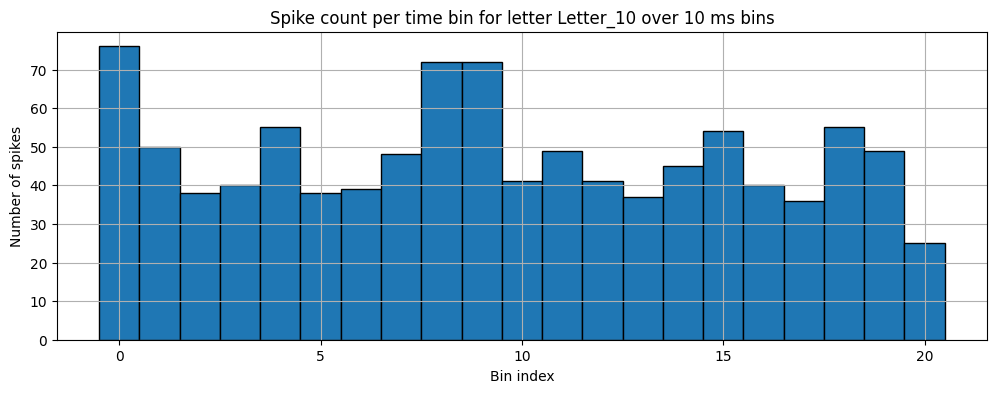

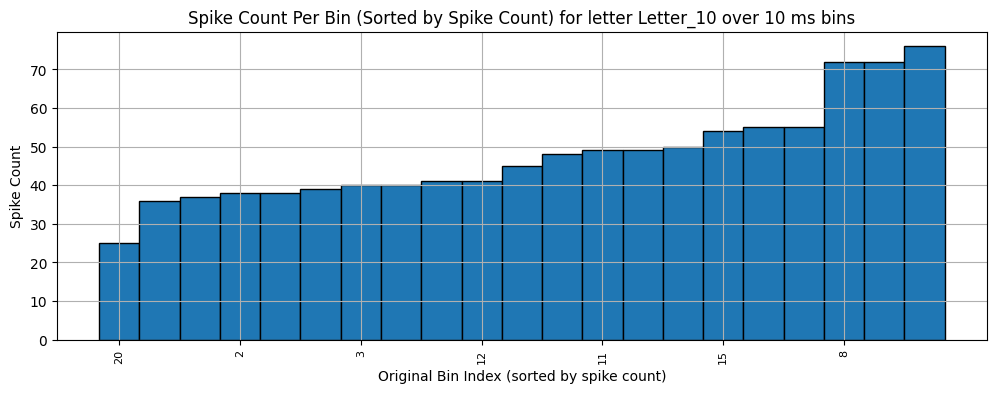


===== Letter Letter_11 =====
Bin starting at 13810ms: 31 coordinates
  Sample coords: [{'timestamp': 13814, 'x': 26, 'y': 235}, {'timestamp': 13815, 'x': 31, 'y': 238}, {'timestamp': 13815, 'x': 391, 'y': 226}]
Bin starting at 13820ms: 65 coordinates
  Sample coords: [{'timestamp': 13820, 'x': 20, 'y': 245}, {'timestamp': 13820, 'x': 23, 'y': 244}, {'timestamp': 13820, 'x': 27, 'y': 234}]
Bin starting at 13830ms: 38 coordinates
  Sample coords: [{'timestamp': 13830, 'x': 51, 'y': 243}, {'timestamp': 13830, 'x': 29, 'y': 237}, {'timestamp': 13830, 'x': 23, 'y': 240}]
Bin starting at 13840ms: 21 coordinates
  Sample coords: [{'timestamp': 13840, 'x': 12, 'y': 236}, {'timestamp': 13840, 'x': 9, 'y': 233}, {'timestamp': 13841, 'x': 21, 'y': 240}]
Bin starting at 13850ms: 37 coordinates
  Sample coords: [{'timestamp': 13850, 'x': 83, 'y': 249}, {'timestamp': 13850, 'x': 32, 'y': 249}, {'timestamp': 13850, 'x': 110, 'y': 236}]
Bin 0: 31 Events
Bin 1: 65 Events
Bin 2: 38 Events
Bin 3: 21 Eve

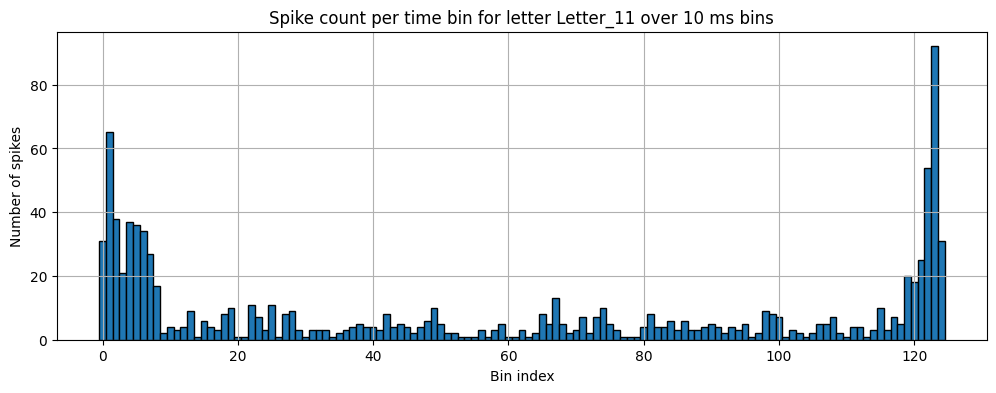

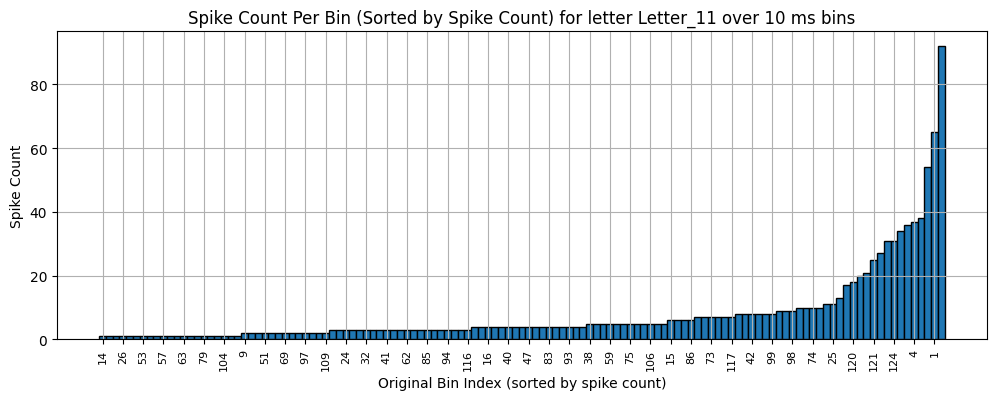


===== Letter Letter_12 =====
Bin starting at 15190ms: 51 coordinates
  Sample coords: [{'timestamp': 15194, 'x': 464, 'y': 331}, {'timestamp': 15194, 'x': 470, 'y': 196}, {'timestamp': 15195, 'x': 465, 'y': 330}]
Bin starting at 15200ms: 78 coordinates
  Sample coords: [{'timestamp': 15200, 'x': 457, 'y': 370}, {'timestamp': 15200, 'x': 460, 'y': 188}, {'timestamp': 15200, 'x': 461, 'y': 327}]
Bin starting at 15210ms: 78 coordinates
  Sample coords: [{'timestamp': 15210, 'x': 462, 'y': 328}, {'timestamp': 15210, 'x': 460, 'y': 197}, {'timestamp': 15210, 'x': 458, 'y': 200}]
Bin starting at 15220ms: 59 coordinates
  Sample coords: [{'timestamp': 15220, 'x': 458, 'y': 202}, {'timestamp': 15220, 'x': 445, 'y': 328}, {'timestamp': 15220, 'x': 461, 'y': 326}]
Bin starting at 15230ms: 56 coordinates
  Sample coords: [{'timestamp': 15230, 'x': 449, 'y': 340}, {'timestamp': 15230, 'x': 451, 'y': 200}, {'timestamp': 15230, 'x': 458, 'y': 185}]
Bin 0: 51 Events
Bin 1: 78 Events
Bin 2: 78 Events

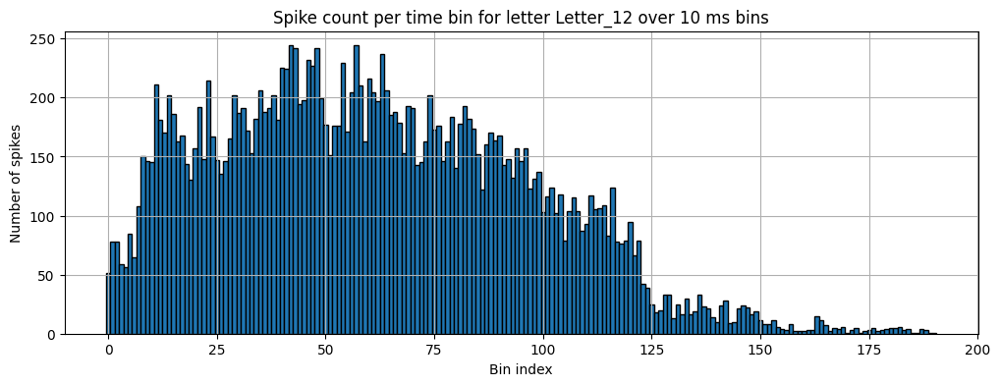

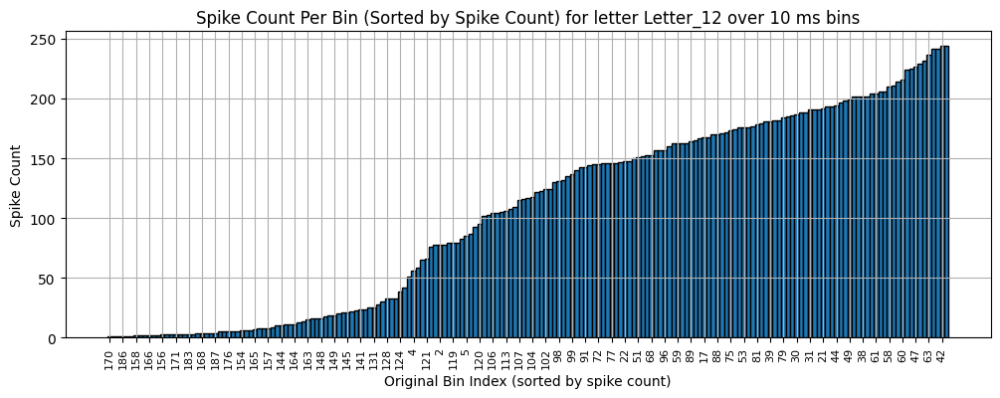


===== Letter Letter_13 =====
Bin starting at 17180ms: 1 coordinates
  Sample coords: [{'timestamp': 17187, 'x': 411, 'y': 627}]
Bin starting at 17190ms: 4 coordinates
  Sample coords: [{'timestamp': 17195, 'x': 309, 'y': 572}, {'timestamp': 17196, 'x': 310, 'y': 572}, {'timestamp': 17198, 'x': 309, 'y': 572}]
Bin starting at 17200ms: 9 coordinates
  Sample coords: [{'timestamp': 17200, 'x': 378, 'y': 268}, {'timestamp': 17200, 'x': 309, 'y': 572}, {'timestamp': 17201, 'x': 309, 'y': 572}]
Bin starting at 17210ms: 1 coordinates
  Sample coords: [{'timestamp': 17218, 'x': 27, 'y': 356}]
Bin starting at 17230ms: 1 coordinates
  Sample coords: [{'timestamp': 17233, 'x': 407, 'y': 258}]
Bin 0: 1 Events
Bin 1: 4 Events
Bin 2: 9 Events
Bin 3: 1 Events
Bin 4: 1 Events
Bin 5: 1 Events
Bin 6: 3 Events
Bin 7: 2 Events
Bin 8: 7 Events
Bin 9: 4 Events
Bin 10: 7 Events
Bin 11: 3 Events
Bin 12: 3 Events
Bin 13: 1 Events
Bin 14: 10 Events
Bin 15: 4 Events
Bin 16: 2 Events
Bin 17: 3 Events
Bin 18: 5 E

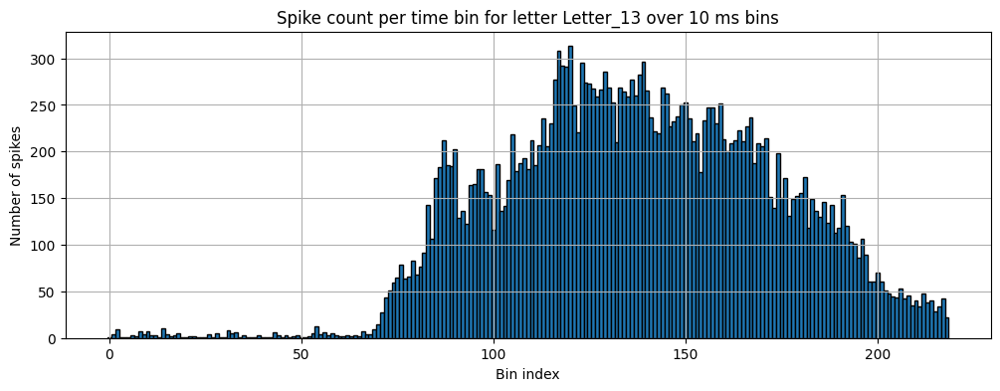

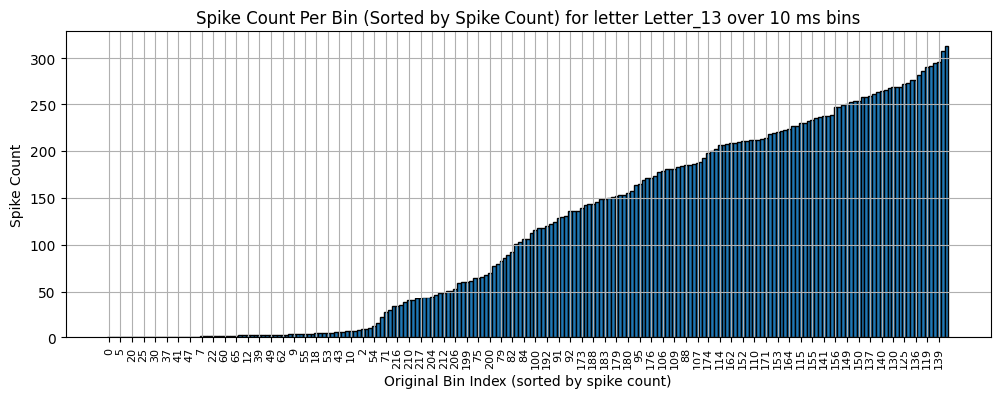


===== Letter Letter_14 =====
Bin starting at 19490ms: 14 coordinates
  Sample coords: [{'timestamp': 19496, 'x': 38, 'y': 215}, {'timestamp': 19496, 'x': 33, 'y': 212}, {'timestamp': 19496, 'x': 58, 'y': 216}]
Bin starting at 19500ms: 34 coordinates
  Sample coords: [{'timestamp': 19500, 'x': 48, 'y': 218}, {'timestamp': 19500, 'x': 62, 'y': 223}, {'timestamp': 19500, 'x': 43, 'y': 221}]
Bin starting at 19510ms: 30 coordinates
  Sample coords: [{'timestamp': 19510, 'x': 300, 'y': 228}, {'timestamp': 19510, 'x': 44, 'y': 343}, {'timestamp': 19510, 'x': 19, 'y': 344}]
Bin starting at 19520ms: 29 coordinates
  Sample coords: [{'timestamp': 19520, 'x': 46, 'y': 209}, {'timestamp': 19520, 'x': 193, 'y': 543}, {'timestamp': 19520, 'x': 28, 'y': 345}]
Bin starting at 19530ms: 24 coordinates
  Sample coords: [{'timestamp': 19531, 'x': 19, 'y': 212}, {'timestamp': 19531, 'x': 19, 'y': 218}, {'timestamp': 19532, 'x': 18, 'y': 212}]
Bin 0: 14 Events
Bin 1: 34 Events
Bin 2: 30 Events
Bin 3: 29 Ev

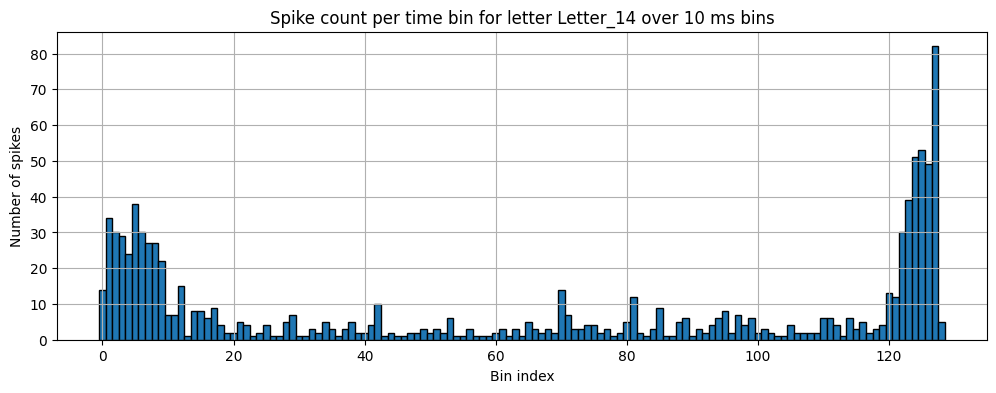

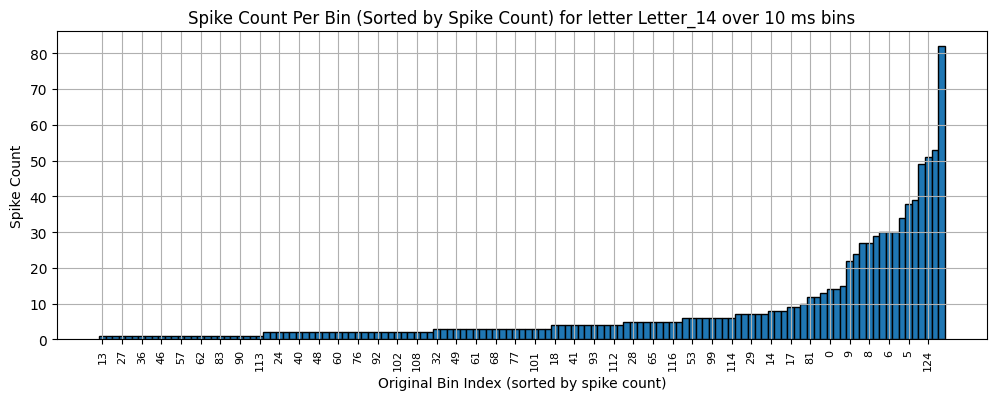


===== Letter Letter_15 =====
Bin starting at 20930ms: 61 coordinates
  Sample coords: [{'timestamp': 20931, 'x': 454, 'y': 177}, {'timestamp': 20931, 'x': 452, 'y': 303}, {'timestamp': 20931, 'x': 436, 'y': 310}]
Bin starting at 20940ms: 75 coordinates
  Sample coords: [{'timestamp': 20940, 'x': 466, 'y': 334}, {'timestamp': 20940, 'x': 463, 'y': 313}, {'timestamp': 20940, 'x': 459, 'y': 293}]
Bin starting at 20950ms: 76 coordinates
  Sample coords: [{'timestamp': 20950, 'x': 451, 'y': 175}, {'timestamp': 20950, 'x': 451, 'y': 303}, {'timestamp': 20950, 'x': 451, 'y': 315}]
Bin starting at 20960ms: 73 coordinates
  Sample coords: [{'timestamp': 20960, 'x': 441, 'y': 170}, {'timestamp': 20960, 'x': 442, 'y': 308}, {'timestamp': 20960, 'x': 447, 'y': 307}]
Bin starting at 20970ms: 98 coordinates
  Sample coords: [{'timestamp': 20970, 'x': 442, 'y': 313}, {'timestamp': 20970, 'x': 440, 'y': 171}, {'timestamp': 20971, 'x': 440, 'y': 292}]
Bin 0: 61 Events
Bin 1: 75 Events
Bin 2: 76 Events

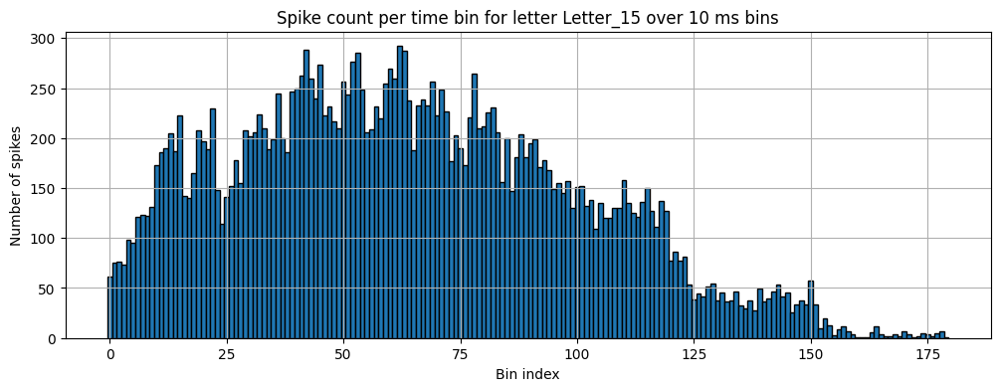

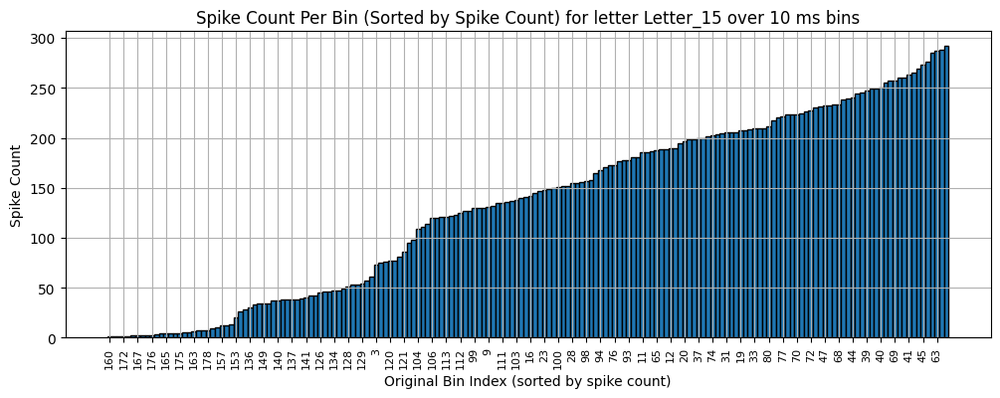


===== Letter Letter_16 =====
Bin starting at 22720ms: 1 coordinates
  Sample coords: [{'timestamp': 22727, 'x': 412, 'y': 627}]
Bin starting at 22730ms: 4 coordinates
  Sample coords: [{'timestamp': 22732, 'x': 390, 'y': 227}, {'timestamp': 22737, 'x': 306, 'y': 638}, {'timestamp': 22737, 'x': 306, 'y': 637}]
Bin starting at 22740ms: 5 coordinates
  Sample coords: [{'timestamp': 22741, 'x': 27, 'y': 14}, {'timestamp': 22741, 'x': 391, 'y': 226}, {'timestamp': 22742, 'x': 306, 'y': 638}]
Bin starting at 22750ms: 4 coordinates
  Sample coords: [{'timestamp': 22751, 'x': 442, 'y': 29}, {'timestamp': 22752, 'x': 427, 'y': 160}, {'timestamp': 22755, 'x': 427, 'y': 160}]
Bin starting at 22760ms: 1 coordinates
  Sample coords: [{'timestamp': 22765, 'x': 27, 'y': 14}]
Bin 0: 1 Events
Bin 1: 4 Events
Bin 2: 5 Events
Bin 3: 4 Events
Bin 4: 1 Events
Bin 5: 4 Events
Bin 6: 8 Events
Bin 7: 1 Events
Bin 8: 4 Events
Bin 9: 2 Events
Bin 10: 4 Events
Bin 11: 3 Events
Bin 12: 3 Events
Bin 13: 2 Events


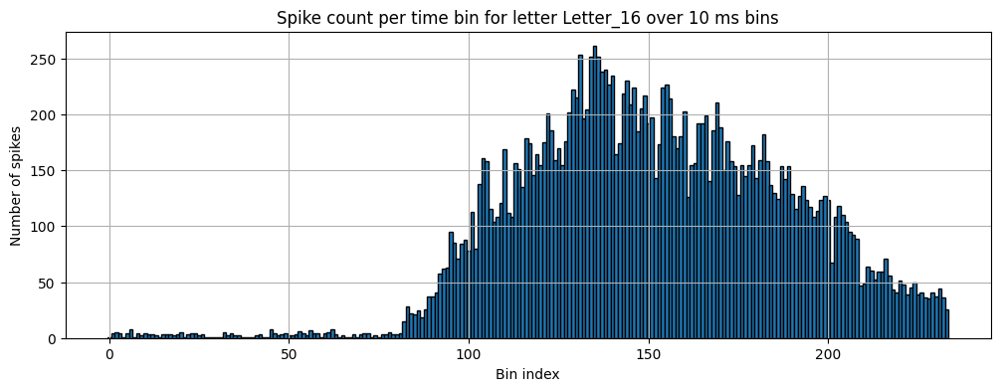

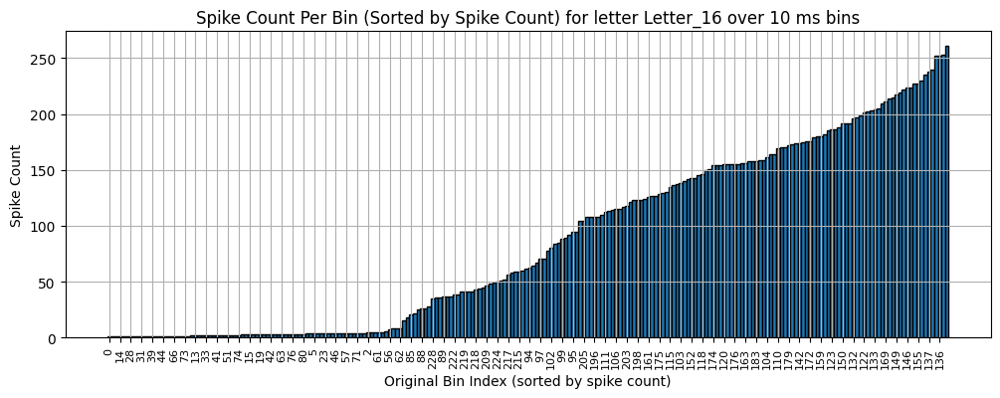


===== Letter Letter_17 =====
Bin starting at 25230ms: 7 coordinates
  Sample coords: [{'timestamp': 25237, 'x': 20, 'y': 329}, {'timestamp': 25238, 'x': 442, 'y': 29}, {'timestamp': 25238, 'x': 145, 'y': 218}]
Bin starting at 25240ms: 37 coordinates
  Sample coords: [{'timestamp': 25240, 'x': 3, 'y': 284}, {'timestamp': 25240, 'x': 2, 'y': 280}, {'timestamp': 25241, 'x': 441, 'y': 29}]
Bin starting at 25250ms: 28 coordinates
  Sample coords: [{'timestamp': 25250, 'x': 22, 'y': 325}, {'timestamp': 25250, 'x': 14, 'y': 332}, {'timestamp': 25250, 'x': 3, 'y': 280}]
Bin starting at 25260ms: 33 coordinates
  Sample coords: [{'timestamp': 25260, 'x': 15, 'y': 323}, {'timestamp': 25261, 'x': 14, 'y': 326}, {'timestamp': 25261, 'x': 8, 'y': 323}]
Bin starting at 25270ms: 27 coordinates
  Sample coords: [{'timestamp': 25270, 'x': 11, 'y': 324}, {'timestamp': 25270, 'x': 7, 'y': 319}, {'timestamp': 25270, 'x': 5, 'y': 327}]
Bin 0: 7 Events
Bin 1: 37 Events
Bin 2: 28 Events
Bin 3: 33 Events
Bin 

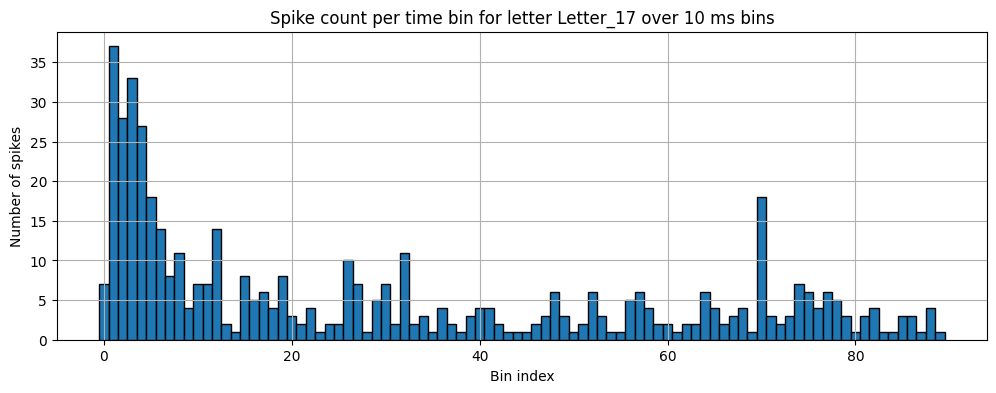

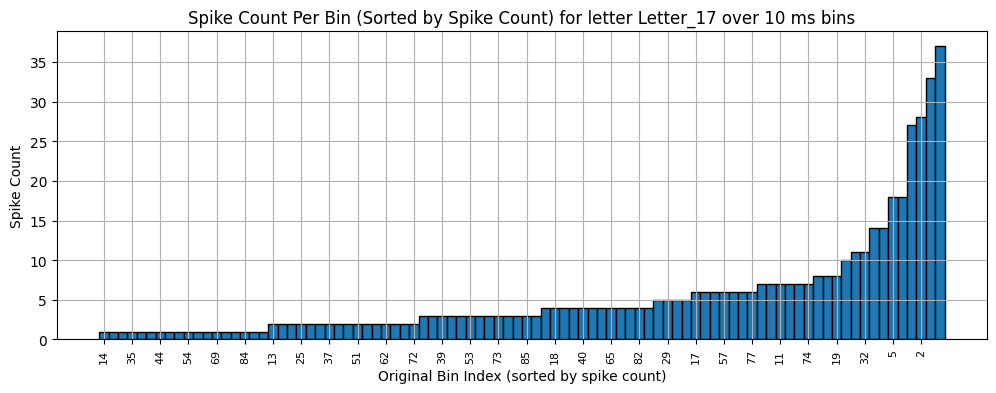

In [408]:
'''Letter based labeling and binning (+diagrams):'''

import networkx as nx


'''================== SEGMENT INTO LETTERS USING CENTROID SHIFT =================='''

segment_threshold = 50  # adjust as needed
bin_duration = 10 #ms
window = 1000
segments = []
current_segment = []
centroids = []
graph_by_letter = {}

for i in range(0, len(df_sorted), window):
    chunk = df_sorted.iloc[i:i+window]
    if chunk.empty:
        continue

    cx = chunk['x'].mean()
    cy = chunk['y'].mean()
    centroids.append((cx, cy))

    if len(centroids) > 1:
        dist = np.linalg.norm(np.array(centroids[-1]) - np.array(centroids[-2]))
        if dist > segment_threshold:
            segments.append(pd.DataFrame(current_segment))
            current_segment = []

    current_segment.extend(chunk.to_dict('records'))

if current_segment:
    segments.append(pd.DataFrame(current_segment))

'''================= LABEL LETTERS =================='''

braille_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J']
labels = braille_labels[:len(segments)]


'''=================== BIN EACH LETTER INDIVIDUALLY =================='''

for i, segment_df in enumerate(segments):
    label = labels[i] if i < len(labels) else f"Letter_{i}"
    print(f"\n===== Letter {label} =====")

    time_bins = defaultdict(list)
    for _, row in segment_df.iterrows():
        bin_start = (row['timestamp'] // bin_duration) * bin_duration
        time_bins[bin_start].append({
            'timestamp': row['timestamp'],
            'x': row['x'],
            'y': row['y']
        })

    # Show first 5 time bins for each letter
    for j, (bin_start, coords_list) in enumerate(sorted(time_bins.items())):
        print(f"Bin starting at {bin_start}ms: {len(coords_list)} coordinates")
        print(f"  Sample coords: {coords_list[:3]}")
        if j >= 4:
            break

    #Extract features from binned data
    #extract events
    node_features = np.array([len(events) for bin_start, events in sorted(time_bins.items())]).reshape(-1, 1)

    for i in range(len(node_features)):
        print(f"Bin {i}: {node_features[i][0]} Events")

    event_counts = node_features.flatten()
    bins = np.arange(len(event_counts))

    #record graph from letter to dictionary
    G = nx.Graph()
    G.add_nodes_from(bins)
    
    graph_by_letter[label] = {
    "graph": G, #record graph data
    "bins": time_bins, #record bin data
    "event_counts": event_counts, #record event counts
    "bin_duration": bin_duration #record the current bin duration <------ added recently - need to look into
    }

    '''==================== PLOT HISTOGRAMS ===================='''

    '''Bin ordered:'''
    plt.figure(figsize = (12, 4))
    plt.bar(np.arange(len(event_counts)), event_counts, width = 1.0, edgecolor = 'black')
    plt.xlabel('Bin index')
    plt.ylabel('Number of spikes')
    plt.title(f'Spike count per time bin for letter {label} over {bin_duration} ms bins')
    plt.grid(True)
    plt.show()

    '''Spike count ordered:'''
    #pair each bin index with corresponding spike count (excluding 0 events)
    bin_spike_pairs = [(i, count) for i, count in enumerate(event_counts) if count > 0]

    #sorted by spike count:
    sorted_pairs = sorted(bin_spike_pairs, key = lambda x: x[1])  # (bin_index, spike_count)

    #unpack into separate lists
    sorted_bins, sorted_counts = zip(*sorted_pairs)

    plt.figure(figsize=(12, 4))
    plt.bar(np.arange(len(sorted_counts)), sorted_counts, tick_label = sorted_bins, width = 1.0, edgecolor = 'black')

    #space out x ticks (every 3 bars)
    xtick_spacing = 3
    plt.xticks(
    ticks = np.arange(0, len(sorted_bins), xtick_spacing),
    labels = [sorted_bins[i] for i in range(0, len(sorted_bins), xtick_spacing)],
    rotation = 90,
    fontsize = 8
    )

    plt.xlabel('Original Bin Index (sorted by spike count)')
    plt.ylabel('Spike Count')
    plt.title(f'Spike Count Per Bin (Sorted by Spike Count) for letter {label} over {bin_duration} ms bins')
    plt.grid(True)
    plt.show()


In [409]:
'''Total Data Binning (time-based)'''

from collections import defaultdict

#time_bins = [0.010, 0.050, 0.100]  #time bin lengths(s) - modular bin sizes

bin = 100  #selected bin duration (100ms).

time_bins = defaultdict(list) #dictionary to store binned data

for _, row in df_sorted.iterrows():
    bin_start = (row['timestamp'] // bin) * bin #floor division to find bin start time
    time_bins[bin_start].append({
    'timestamp': row['timestamp'], #store timestamp
    'x': row['x'],
    'y': row['y']
    }) #record cords into bin
        
#view first 5 time bins
for i, (bin_start, coords_list) in enumerate(sorted(time_bins.items())):
    print(f"Bin starting at {bin_start}ms: {len(coords_list)} coordinates")
    print(f"  Sample coords: {coords_list[:3]}")  #show first 3 coords
    if i >= 4:  #stop after 5 bins
        break


Bin starting at 0ms: 36 coordinates
  Sample coords: [{'timestamp': 10, 'x': 442, 'y': 29}, {'timestamp': 15, 'x': 441, 'y': 29}, {'timestamp': 18, 'x': 357, 'y': 60}]
Bin starting at 100ms: 35 coordinates
  Sample coords: [{'timestamp': 108, 'x': 442, 'y': 29}, {'timestamp': 114, 'x': 198, 'y': 162}, {'timestamp': 115, 'x': 441, 'y': 29}]
Bin starting at 200ms: 41 coordinates
  Sample coords: [{'timestamp': 201, 'x': 98, 'y': 419}, {'timestamp': 202, 'x': 226, 'y': 242}, {'timestamp': 207, 'x': 296, 'y': 331}]
Bin starting at 300ms: 27 coordinates
  Sample coords: [{'timestamp': 304, 'x': 441, 'y': 29}, {'timestamp': 316, 'x': 378, 'y': 268}, {'timestamp': 321, 'x': 426, 'y': 160}]
Bin starting at 400ms: 25 coordinates
  Sample coords: [{'timestamp': 405, 'x': 309, 'y': 572}, {'timestamp': 405, 'x': 310, 'y': 572}, {'timestamp': 407, 'x': 309, 'y': 572}]


Bin 0: 36 Events
Bin 1: 35 Events
Bin 2: 41 Events
Bin 3: 27 Events
Bin 4: 25 Events
Bin 5: 25 Events
Bin 6: 13 Events
Bin 7: 23 Events
Bin 8: 146 Events
Bin 9: 802 Events
Bin 10: 1014 Events
Bin 11: 1318 Events
Bin 12: 1197 Events
Bin 13: 1208 Events
Bin 14: 1112 Events
Bin 15: 950 Events
Bin 16: 1070 Events
Bin 17: 969 Events
Bin 18: 855 Events
Bin 19: 726 Events
Bin 20: 615 Events
Bin 21: 154 Events
Bin 22: 29 Events
Bin 23: 28 Events
Bin 24: 40 Events
Bin 25: 32 Events
Bin 26: 37 Events
Bin 27: 45 Events
Bin 28: 32 Events
Bin 29: 49 Events
Bin 30: 32 Events
Bin 31: 17 Events
Bin 32: 41 Events
Bin 33: 27 Events
Bin 34: 27 Events
Bin 35: 16 Events
Bin 36: 24 Events
Bin 37: 547 Events
Bin 38: 1398 Events
Bin 39: 1953 Events
Bin 40: 1979 Events
Bin 41: 2109 Events
Bin 42: 2094 Events
Bin 43: 1786 Events
Bin 44: 1662 Events
Bin 45: 1545 Events
Bin 46: 1359 Events
Bin 47: 1194 Events
Bin 48: 987 Events
Bin 49: 758 Events
Bin 50: 149 Events
Bin 51: 30 Events
Bin 52: 20 Events
Bin 53: 26 E

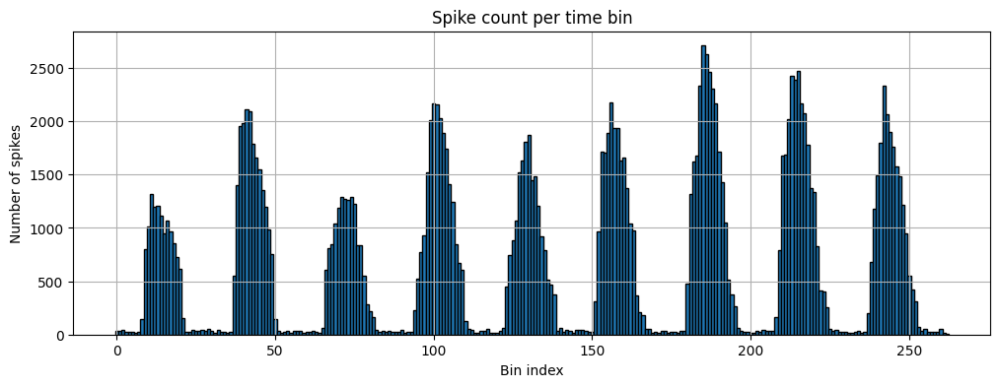

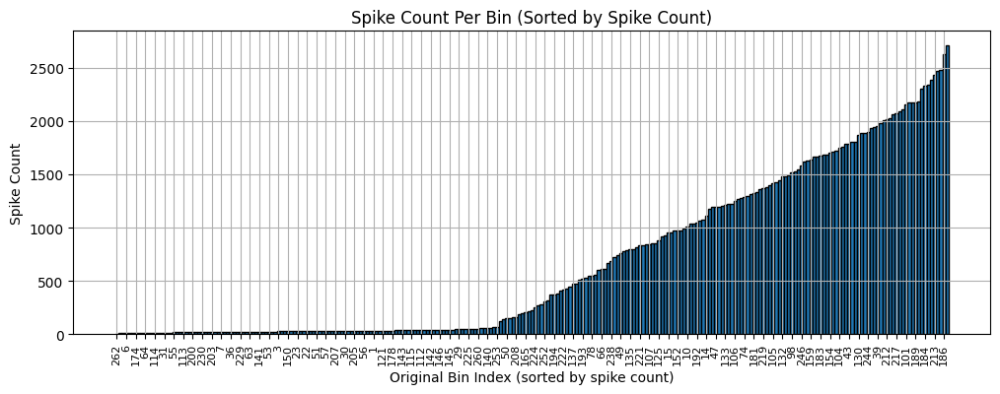

'\nbins = np.arange(14)\ncenters = bins[:-1] + np.diff(bins) / 2\ny = np.sin(centers / 2)\n\nplt.step(bins[:-1], y, where=\'post\', label=\'step(where="post")\')\nplt.plot(bins[:-1], y, \'o--\', color=\'grey\', alpha=0.3)\n\nplt.stairs(y - 1, bins, baseline=None, label=\'stairs()\')\nplt.plot(centers, y - 1, \'o--\', color=\'grey\', alpha=0.3)\nplt.plot(np.repeat(bins, 2), np.hstack([y[0], np.repeat(y, 2), y[-1]]) - 1,\n         \'o\', color=\'red\', alpha=0.2)\n\nplt.legend()\nplt.title(\'step() vs. stairs()\')\nplt.show()\n'

In [410]:
'''Total Data Histograms (including feature extraction)'''

#Extract features from binned data
import networkx as nx

#extract events
node_features = np.array([len(events) for bin_start, events in sorted(time_bins.items())]).reshape(-1, 1)

for i in range(len(node_features)):
    print(f"Bin {i}: {node_features[i][0]} Events")

event_counts = node_features.flatten()
bins = np.arange(len(event_counts))

G = nx.Graph()
G.add_nodes_from(bins)

'''Bin-ordered:'''

plt.figure(figsize = (12, 4))
plt.bar(np.arange(len(event_counts)), event_counts, width = 1.0, edgecolor = 'black')
plt.xlabel('Bin index')
plt.ylabel('Number of spikes')
plt.title('Spike count per time bin')
plt.grid(True)
plt.show()

'''Spike-count ordered:'''

#pair each bin index with corresponding spike count (excluding 0 events)
bin_spike_pairs = [(i, count) for i, count in enumerate(event_counts) if count > 0]

#sorted by spike-count:
sorted_pairs = sorted(bin_spike_pairs, key = lambda x: x[1])  # (bin_index, spike_count)

#unpack into separate lists
sorted_bins, sorted_counts = zip(*sorted_pairs)

plt.figure(figsize=(12, 4))
plt.bar(np.arange(len(sorted_counts)), sorted_counts, tick_label = sorted_bins, width = 1.0, edgecolor = 'black')

#space out x ticks (every 3 bars)
xtick_spacing = 3
plt.xticks(
    ticks = np.arange(0, len(sorted_bins), xtick_spacing),
    labels = [sorted_bins[i] for i in range(0, len(sorted_bins), xtick_spacing)],
    rotation = 90,
    fontsize = 8
)

plt.xlabel('Original Bin Index (sorted by spike count)')
plt.ylabel('Spike Count')
plt.title('Spike Count Per Bin (Sorted by Spike Count)')
plt.grid(True)
plt.show()

#what do you mean by staircase plot?
#attempt:
'''
#plot staircase
plt.figure(figsize=(10, 4))
plt.stairs(event_counts, edges=np.arange(len(event_counts) + 1), fill=True)
plt.xlabel("Bin Index")
plt.ylabel("Spike Count")
plt.title("Spike Count Per Bin (Stairs Plot)")
plt.grid(True)
plt.show()
'''

#example for staircase plot
'''
bins = np.arange(14)
centers = bins[:-1] + np.diff(bins) / 2
y = np.sin(centers / 2)

plt.step(bins[:-1], y, where='post', label='step(where="post")')
plt.plot(bins[:-1], y, 'o--', color='grey', alpha=0.3)

plt.stairs(y - 1, bins, baseline=None, label='stairs()')
plt.plot(centers, y - 1, 'o--', color='grey', alpha=0.3)
plt.plot(np.repeat(bins, 2), np.hstack([y[0], np.repeat(y, 2), y[-1]]) - 1,
         'o', color='red', alpha=0.2)

plt.legend()
plt.title('step() vs. stairs()')
plt.show()
'''

In [411]:
'''=========================== UNWAIGHTED ==========================='''

#---------------------------- SPIKE-COUNT BASED, UNDIRECTED -----------------------------
def UNDIR_SPIKE_COUNT(event_counts, base_graph, time_bins, bin_duration):

  '''Edges connect bins with identical spike counts'''

  #Adjacent - bins with identical spike counts
  title = "Adjacent bins - identical spike counts"

  G = base_graph.copy() #reuse existing nodes

  for i in range(len(event_counts)):
    for j in range(i + 1, len(event_counts)):
      if event_counts[i] == event_counts[j]:
          G.add_edge(i, j, weight = 0.5) #identical spike counts

  return G, title, False #not weighted



#---------------------------- TIME BASED, DIRECTED -----------------------------
def DIR_TIME(event_counts, base_graph, time_bins, bin_duration):
    
  '''Edges connect time bins at a chronological order'''

  title = "Adjacent bins - directed for succeeding time bins"
    
    #convert to a directed graph with same nodes
  G = nx.DiGraph()
  G.add_nodes_from(base_graph.nodes())  #reuse existing nodes

    #connect each time bin to next one in sequence
  for i in range(len(time_bins) - 1):
      G.add_edge(i, i + 1, weight = 1)

  return G, title, False #not weighted

'''============================ WEIGHTED ============================='''

#-------------------------- SPIKE-COUNT BASED, UNDIRECTED ------------------------
def UNDIR_SPIKE_COUNT_W(event_counts, base_graph, time_bins, bin_duration):

  '''Edges connect bins with identical spike counts - the more common a spike count is across the bins - the higher its edge's weight.'''

  #Adjacent - identical spike counts
  #Greater weight - the more identical counts the larger the weight 

  title = "Adjacent bins - identical spike counts, shorter edges = more bins identical counts"
  weighted = True

  G = base_graph.copy() #reuse existing nodes

  matching_pairs = [
  (i,j)
  for i, j in combinations(range(len(event_counts)), 2)
    if event_counts[i] == event_counts[j]
  ]

  #total number of matching pairs
  total_matches = len(matching_pairs)

  if total_matches > 0:
    weight = 1 / total_matches #minimizing weight for shorter edges
  else: 
       weight = float('inf') #ignore it (really large number)

  for i, j in matching_pairs:
       G.add_edge(i, j, weight = weight) 

  return G, title, True #weighted

#-------------------------- SPIKE-COUNT BASED, DIRECTED ------------------------
def DIR_SPIKE_COUNT_W(event_counts, base_graph, time_bins, bin_duration):

  '''Edges connect bins with increasing spike count - WEIGHTED - shorter edges for for identical spike counts'''

  #Adjacent - bins with increasing spike counts + weights for identical counts
  title = "Adjacent bins - directed for increasing spike counts"
  
  #convert to a directed graph with same nodes
  G = nx.DiGraph()
  G.add_nodes_from(base_graph.nodes())  #reuse existing nodes

  for i in range(len(event_counts)):
    for j in range(i + 1, len(event_counts)):
      if event_counts[i] < event_counts[j]: #any increase
        if event_counts[i] + 1 == event_counts[j]:
            G.add_edge(i, j, weight = 0.3) #shorter edge for a +1 increment
        else:
           G.add_edge(i,j, weight = 1) #normal edge for any other increase
      elif event_counts[i] == event_counts[j]:
            G.add_edge(i, j, weight = 0.5) #shorter edge for identical spike counts

  return G, title, True #weighted

In [412]:
'''============================================== State Machine ====================================================='''

from torch_geometric.utils import from_networkx
import torch

def graph_gen(G, title, weighted):
  
  '''Graph generation function'''
  #if weighted add weight to edges

  #force-directed layout for clarity (not a perfect circle)
  pos = nx.spring_layout(G, seed=42, k = 0.5)

  nx.draw(
    G,
    pos = pos,
    with_labels=True,
    node_color='lightsteelblue',
    node_size=50,
    font_size=6,
    width=1.0,
    edge_color='gray',)

  if weighted:
   edge_labels = nx.get_edge_attributes(G, 'weight')
   nx.draw_networkx_edge_labels(G, pos, edge_labels = edge_labels, font_size = 5)

  plt.margins(0.1)
  plt.title(title)
  plt.show()

#available states:
states = {
    'undir_spike_count': UNDIR_SPIKE_COUNT,
    'dir_time': DIR_TIME,
    'dir_spike_count_w': DIR_SPIKE_COUNT_W,
    'undir_spike_count_w': UNDIR_SPIKE_COUNT_W
}

def nx2pyg(G, label = None):

  '''Format conversion function from network x to python geometric:'''

  #setting default values if node lacks features(x) or positions(pos)
  for node in G.nodes:
    if 'x' not in G.nodes[node]:
      G.nodes[node]['x'] = [1] 
    if 'pos' not in G.nodes[node]:
      G.nodes[node]['pos'] = [0, 0]

  #setting default edge attributes if edge weights or time are missing  
  for u, v, attr in G.edges(data = True):
    if 'weight' not in attr:
      attr['weight'] = 1
    if 'time' not in attr:
      attr['time'] = 0

  #converts networkx graph into torch geometric data object
  #convert all nodes and edges into pytorch tensors
  data = from_networkx(G)

  #combine edge attributes: weight and time into 2D tensor per edge: [weight,time]
  if G.number_of_edges() > 0:
    data.edge_attr = torch.stack([
      data.weight,
      data.time
    ], dim = 1) if 'time' in data else data.weight.unsqueeze(1) #squeeze ensures edge_attr is 2D even if one attribute is missing. 

  #handle empty graphs
  data.edge_attr = torch.empty((0, 2), dtype = torch.float) #empty edge attributes for edge-less graphs.

  #convert each node's x and pos attributes into pytorch tensors:
  data.x = torch.tensor([G.nodes[n]['x'] for n in G.nodes],dtype = torch.float )
  data.pos = torch.tensor([G.nodes[n]['pos'] for n in G.nodes],dtype = torch.float )

  #ground truth for model training
  if label is not None:
    data.y = torch.tensor([label], dtype = torch.float) #ground truth for training - y label for loss function.

  return data

'''
def visualizer(letter_dictionary, letter = None):
    
  #visualizes, stores and converts graphs generated by the generator

  #if specific letter requested, process only that letter, else all
  letters_to_process = [letter] if letter in letter_dictionary else letter_dictionary.keys()  
    
  for letter_key in letters_to_process:
    data = letter_dictionary[letter_key]
    print(f"Running all graph states for letter {letter}...\n")
      
    event_counts = data['event_counts']
    time_bins = data['bins']
    bin_duration = data['bin_duration']
    base_graph = data['graph']

    #store generated graphs for model:
    data['graph_variants'] = {} #for graph variants
    data['pyg_graphs'] = {} #for pyg graphs

    
    for name, func in states.items():
      G, title, weighted = func(event_counts, base_graph, time_bins, bin_duration)
      print(f"Visualizing: {title}")
      graph_gen(G, title = f"{title} ({letter_key})", weighted = weighted)

      data['graph_variants'][name] = G #save graph in dictionary
      
      #convert and store pyg graph
      pyg_graph = nx2pyg(G, label = None)  #use label if available
      data['pyg_graphs'][name] = pyg_graph

  pyg_data = {letter: data['pyg_graphs'] for letter, data in letter_dictionary.items() if 'pyg_graphs' in data}
  
  # Set save name to match the .npy file name with "_pyg_graphs" ending
  save_name = os.path.basename(file_path).replace('.npy', '_pyg_graphs.pt')
  torch.save(pyg_data, save_name)
  
  print(f"Saved PyG graphs for letters: {list(pyg_data.keys())}")

#i could also print the dictionary information for specific letter instead if im lazy
'''

'\ndef visualizer(letter_dictionary, letter = None):\n    \n  #visualizes, stores and converts graphs generated by the generator\n\n  #if specific letter requested, process only that letter, else all\n  letters_to_process = [letter] if letter in letter_dictionary else letter_dictionary.keys()  \n    \n  for letter_key in letters_to_process:\n    data = letter_dictionary[letter_key]\n    print(f"Running all graph states for letter {letter}...\n")\n      \n    event_counts = data[\'event_counts\']\n    time_bins = data[\'bins\']\n    bin_duration = data[\'bin_duration\']\n    base_graph = data[\'graph\']\n\n    #store generated graphs for model:\n    data[\'graph_variants\'] = {} #for graph variants\n    data[\'pyg_graphs\'] = {} #for pyg graphs\n\n    \n    for name, func in states.items():\n      G, title, weighted = func(event_counts, base_graph, time_bins, bin_duration)\n      print(f"Visualizing: {title}")\n      graph_gen(G, title = f"{title} ({letter_key})", weighted = weighted)\n

In [413]:
def generate_and_save_graphs(letter_dictionary, file_path):
    '''generates graphs and saves them in model2 format - short and simple'''
    
    # Generate graphs for all letters (same as visualizer)
    for letter_key in letter_dictionary.keys():
        data = letter_dictionary[letter_key]
        
        event_counts = data['event_counts']
        time_bins = data['bins']
        bin_duration = data['bin_duration']
        base_graph = data['graph']
        
        # Store both pyg_graphs AND graph_variants + graph_info for visualizer
        data['pyg_graphs'] = {}
        data['graph_variants'] = {}  # Add this for visualizer
        data['graph_info'] = {}      # Add this for visualizer
        
        for name, func in states.items():
            G, title, weighted = func(event_counts, base_graph, time_bins, bin_duration)
            pyg_graph = nx2pyg(G, label=None)
            
            data['pyg_graphs'][name] = pyg_graph
            data['graph_variants'][name] = G              # Store for visualizer
            data['graph_info'][name] = {'title': title, 'weighted': weighted}  # Store for visualizer
    
    # Split configuration
    split_config = {
        'train': {'led_on': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H'], 'led_off': ['C', 'D', 'E', 'F', 'G', 'H', 'I', 'J']},
        'val': {'led_on': ['I'], 'led_off': ['A']},
        'test': {'led_on': ['J'], 'led_off': ['B']}
    }
    
    # Extract info from filename
    file_base = os.path.basename(file_path)
    
    # Extract trial number
    if 'trial_' in file_base:
        trial_num = file_base.split('trial_')[1].split('_')[0]
    else:
        trial_num = '1'  # default
    
    # Determine letter and LED condition
    if 'taps_trial' in file_base:
        letter = 'A'
    else:
        letter = file_base.split('_')[0].upper()
    
    is_led_on = '_on.npy' in file_base
    led_status = 'on' if is_led_on else 'off'
    
    # Find split
    split = None
    for split_name, config in split_config.items():
        if (is_led_on and letter in config['led_on']) or (not is_led_on and letter in config['led_off']):
            split = split_name
            break
    
    if not split:
        print(f"No split found for {file_base}")
        return
    
    # Create directories next to your .npy file
    data_dir = os.path.dirname(file_path)
    for s in ['train', 'val', 'test']:
        os.makedirs(os.path.join(data_dir, f'data/{s}/processed'), exist_ok=True)
    
    # Save individual graphs with new naming
    save_dir = os.path.join(data_dir, f'data/{split}/processed')
    
    for letter_key, data in letter_dictionary.items():
        if 'pyg_graphs' in data:
            for state_name, pyg_graph in data['pyg_graphs'].items():
                # Add label
                if len(letter_key) == 1 and letter_key.isalpha():
                    label_value = ord(letter_key) - ord('A')
                else:
                    label_value = int(letter_key.split('_')[1]) if 'Letter_' in letter_key else 0
                
                pyg_graph.y = torch.tensor([label_value], dtype=torch.long)
                
                # New filename format: trial_1_events_off_A_undir_spike_count.pt
                filename = f"trial_{trial_num}_events_{led_status}_{letter_key}_{state_name}.pt"
                save_path = os.path.join(save_dir, filename)
                torch.save(pyg_graph, save_path)
    
    total_files = len(letter_dictionary) * len(states)
    print(f"Saved {total_files} files to {save_dir}")
    print(f"Format: trial_{trial_num}_events_{led_status}_[LETTER]_[GRAPH_TYPE].pt")


def visualize_graphs(letter_dictionary, letter = None):
    
    '''visualizes already generated graphs'''
    
    #if specific letter requested, process only that letter, else all
    letters_to_process = [letter] if letter in letter_dictionary else letter_dictionary.keys()  
      
    for letter_key in letters_to_process:
        data = letter_dictionary[letter_key]
        
        if 'graph_variants' in data and 'graph_info' in data:
            print(f"Visualizing graphs for letter {letter_key}...\n")
            for name in data['graph_variants'].keys():
                G = data['graph_variants'][name]
                title = data['graph_info'][name]['title']
                weighted = data['graph_info'][name]['weighted']
                
                print(f"Visualizing: {title}")
                graph_gen(G, title = f"{title} ({letter_key})", weighted = weighted)
        else:
            print(f"No graphs found for letter {letter_key}. Run generate_and_save_graphs() first.")

In [414]:
generate_and_save_graphs(graph_by_letter, file_path)


Saved 72 files to C:/Users/Teamaerosal/Desktop/Dissertation DUE 29TH AUG/Essentials for Braille Project/07_03_collect_10_row1_1/events\data/train/processed
Format: trial_9_events_on_[LETTER]_[GRAPH_TYPE].pt


Visualizing graphs for letter A...

Visualizing: Adjacent bins - identical spike counts


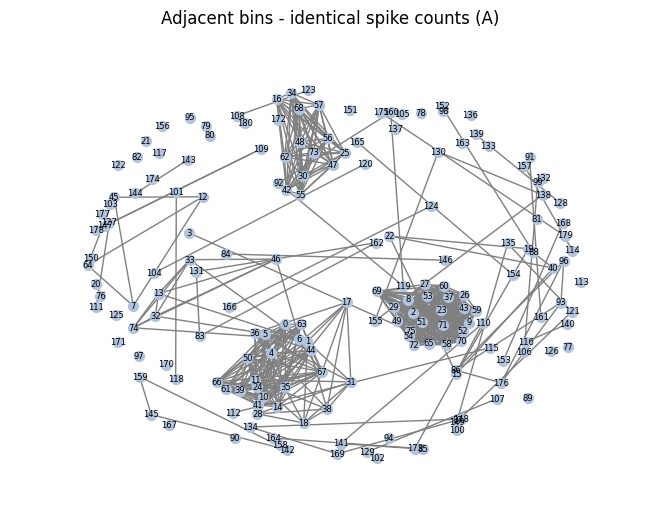

Visualizing: Adjacent bins - directed for succeeding time bins


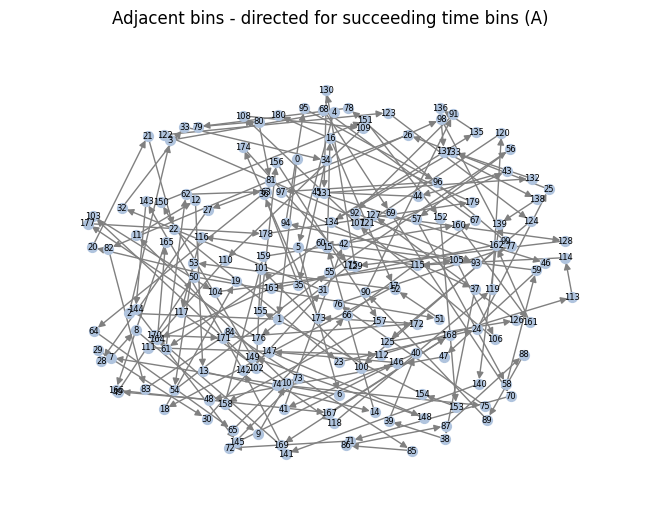

Visualizing: Adjacent bins - directed for increasing spike counts


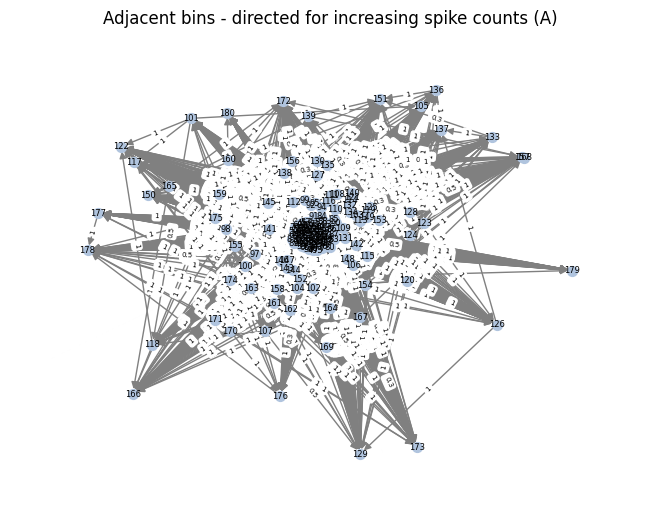

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


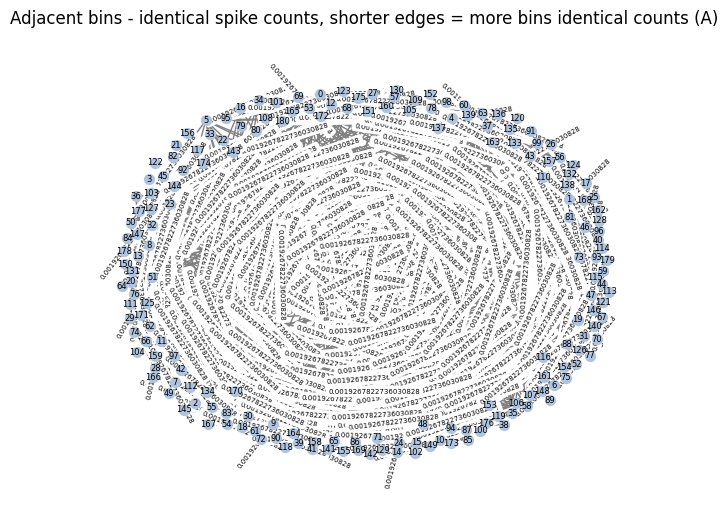

Visualizing graphs for letter B...

Visualizing: Adjacent bins - identical spike counts


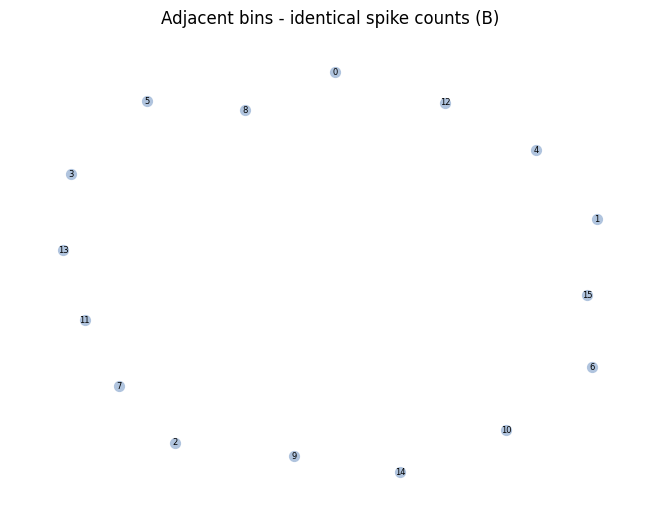

Visualizing: Adjacent bins - directed for succeeding time bins


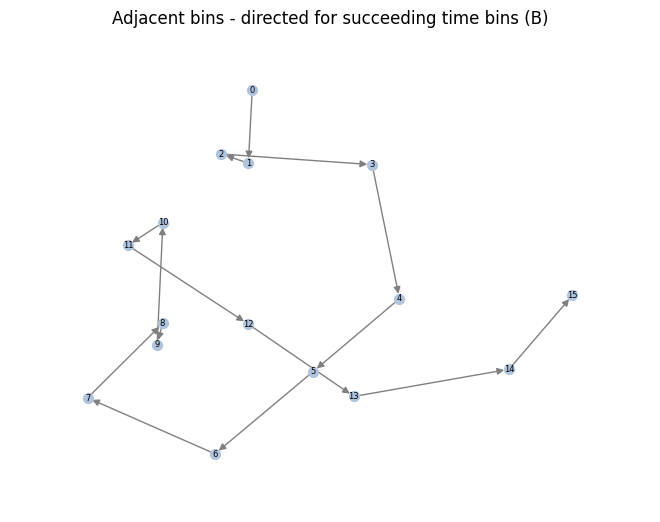

Visualizing: Adjacent bins - directed for increasing spike counts


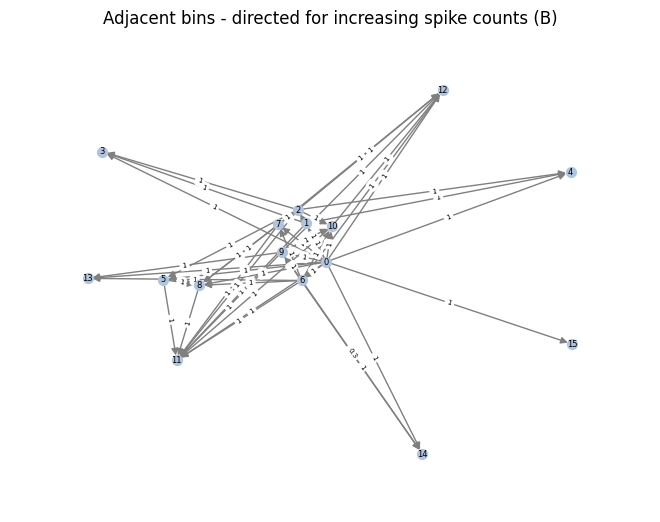

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


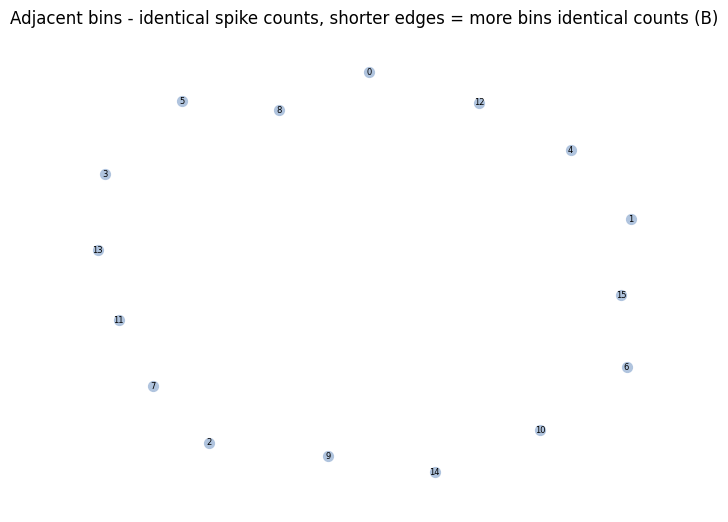

Visualizing graphs for letter C...

Visualizing: Adjacent bins - identical spike counts


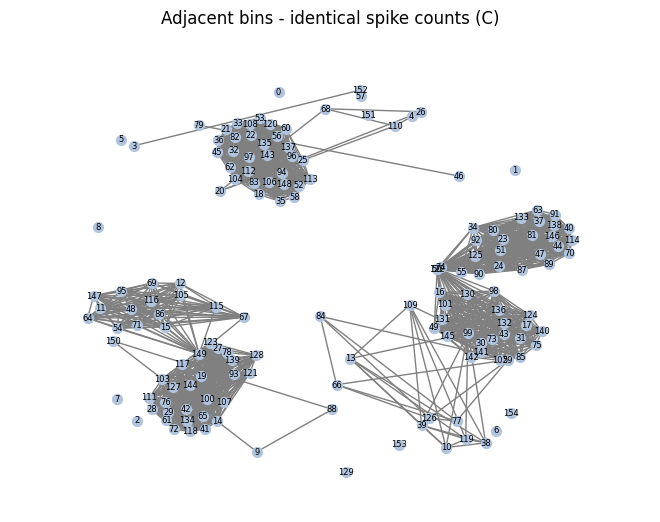

Visualizing: Adjacent bins - directed for succeeding time bins


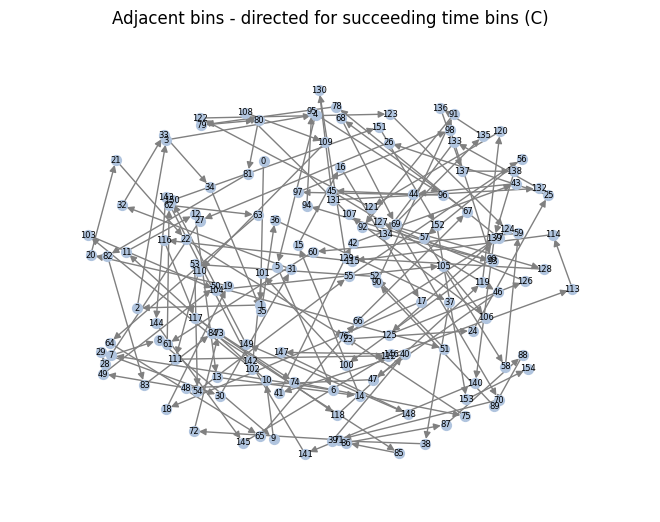

Visualizing: Adjacent bins - directed for increasing spike counts


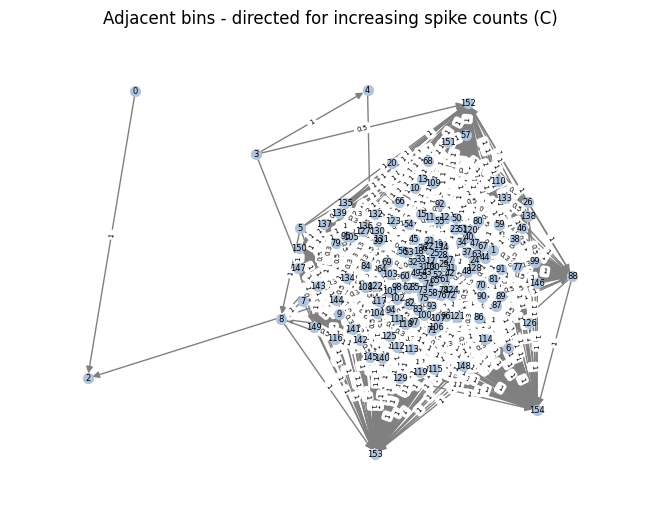

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


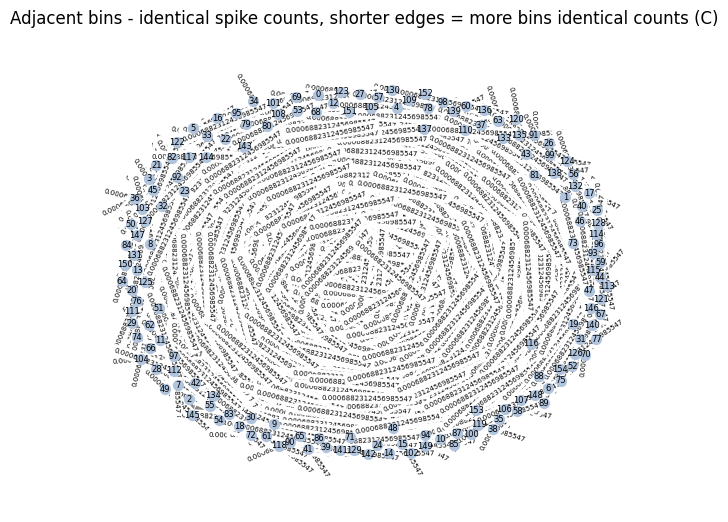

Visualizing graphs for letter D...

Visualizing: Adjacent bins - identical spike counts


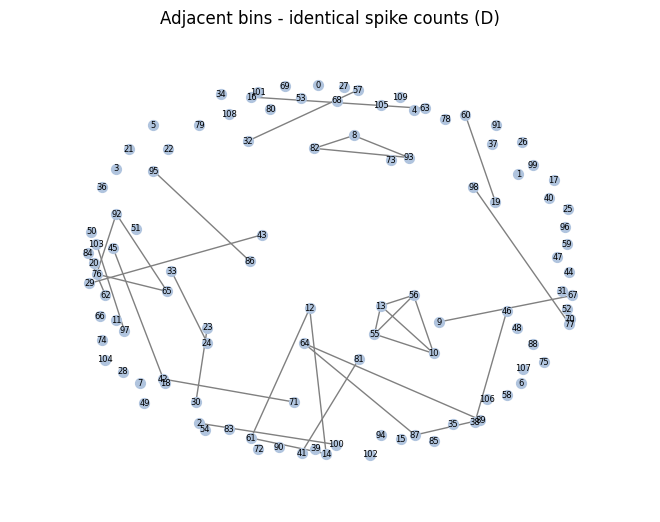

Visualizing: Adjacent bins - directed for succeeding time bins


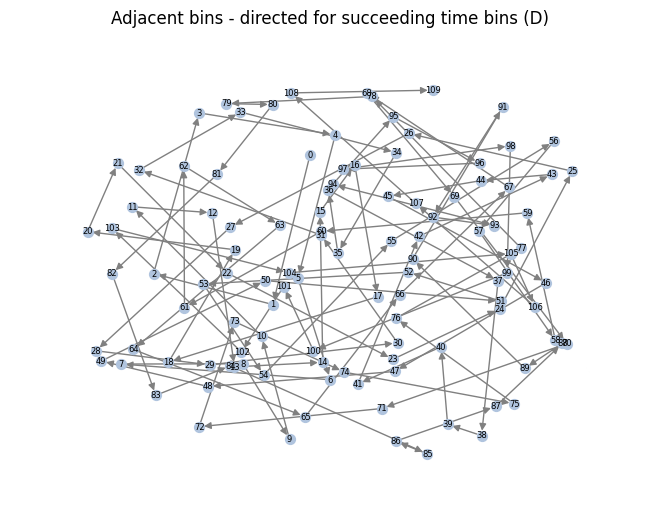

Visualizing: Adjacent bins - directed for increasing spike counts


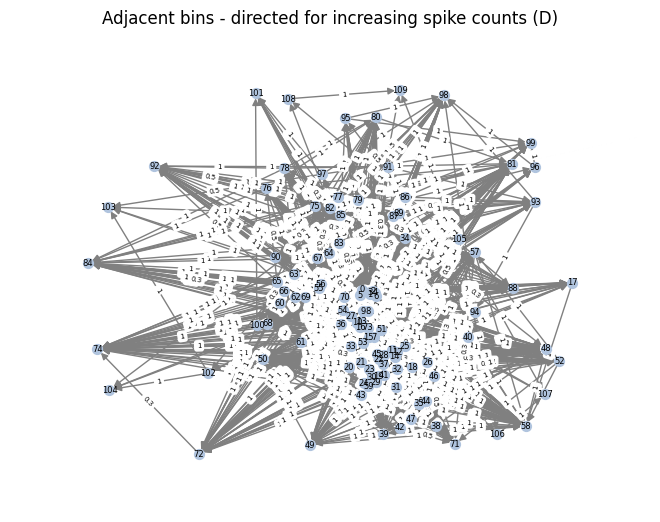

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


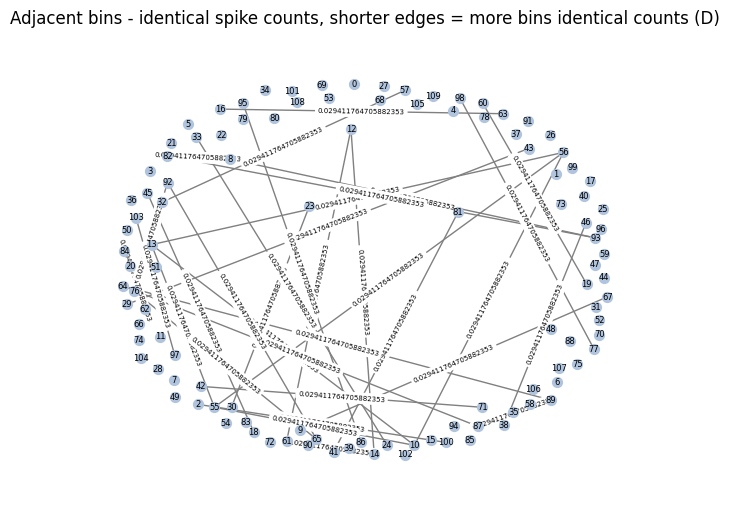

Visualizing graphs for letter E...

Visualizing: Adjacent bins - identical spike counts


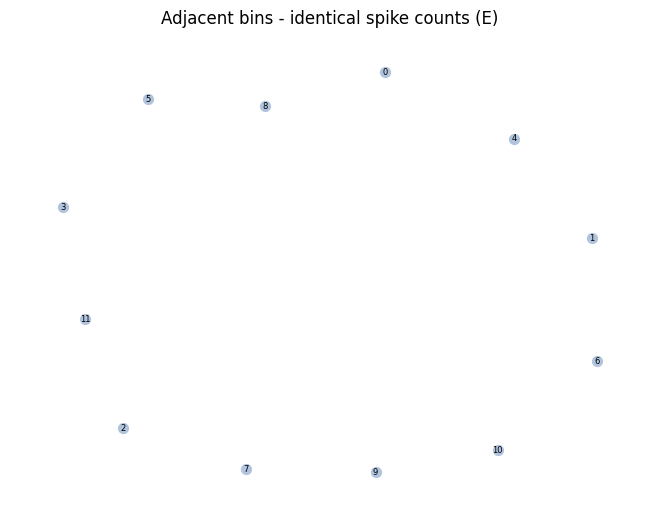

Visualizing: Adjacent bins - directed for succeeding time bins


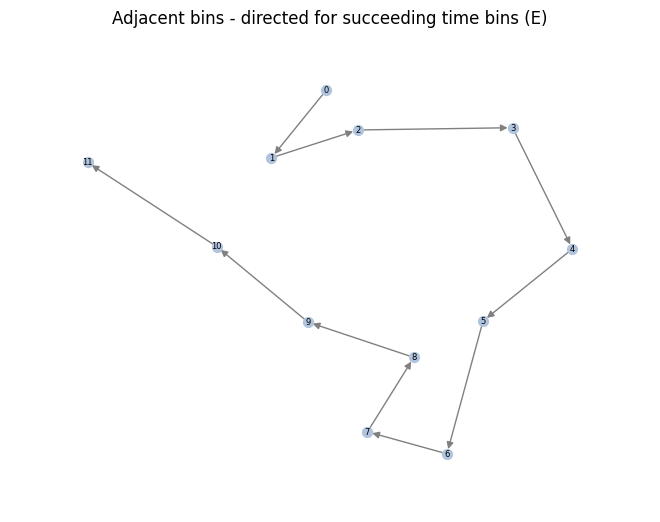

Visualizing: Adjacent bins - directed for increasing spike counts


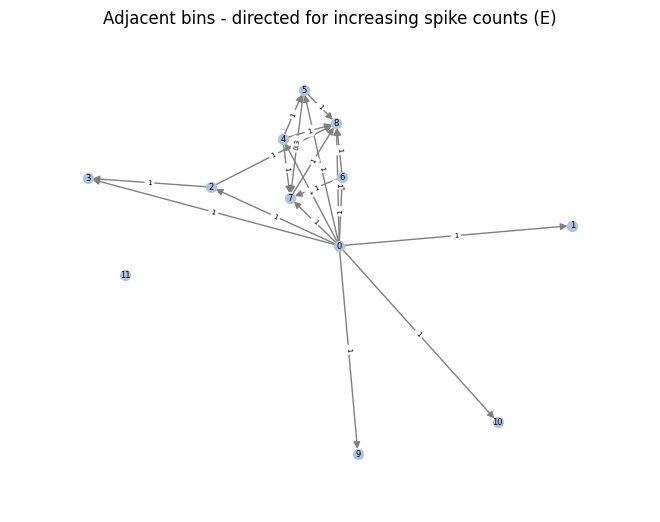

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


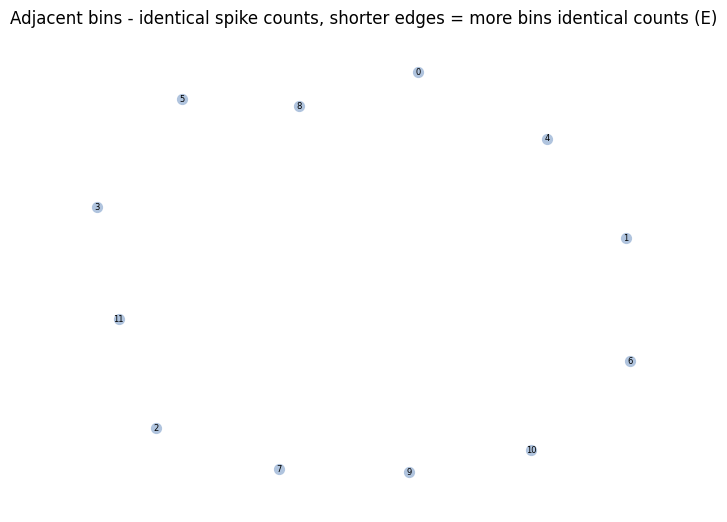

Visualizing graphs for letter F...

Visualizing: Adjacent bins - identical spike counts


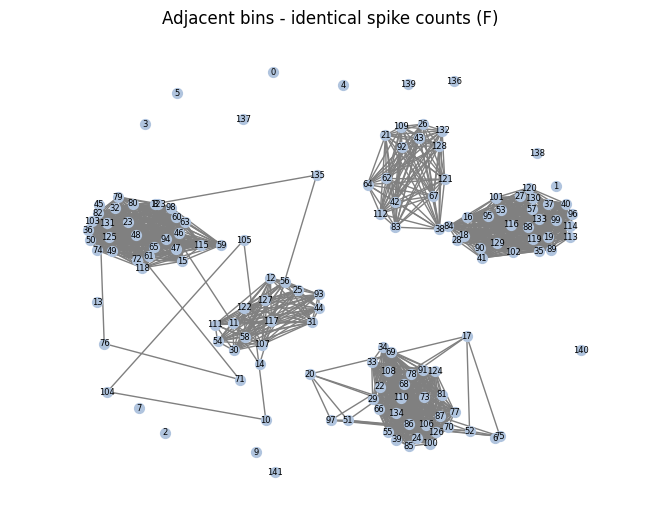

Visualizing: Adjacent bins - directed for succeeding time bins


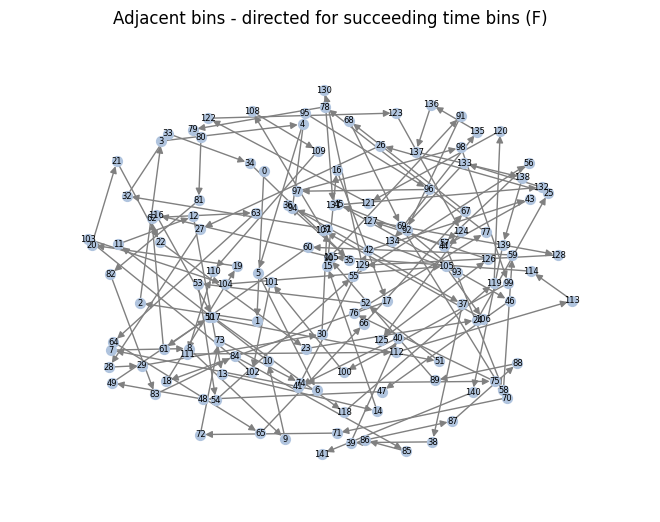

Visualizing: Adjacent bins - directed for increasing spike counts


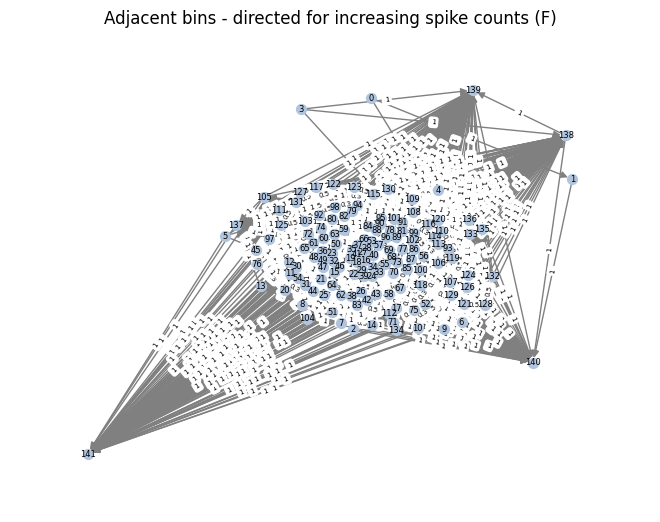

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


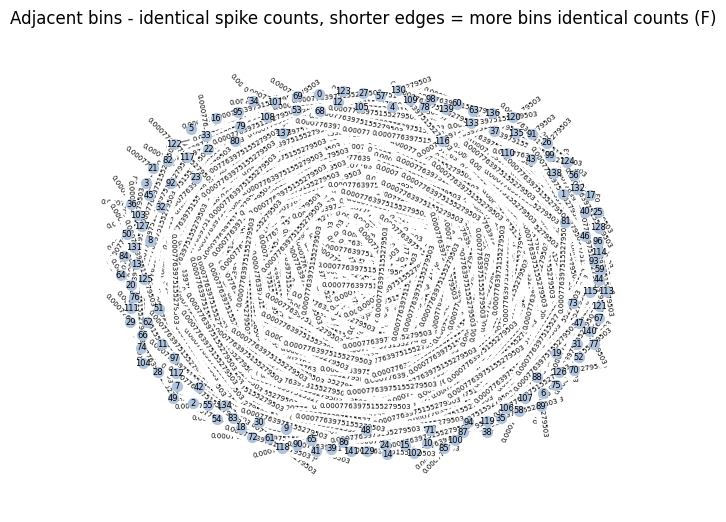

Visualizing graphs for letter G...

Visualizing: Adjacent bins - identical spike counts


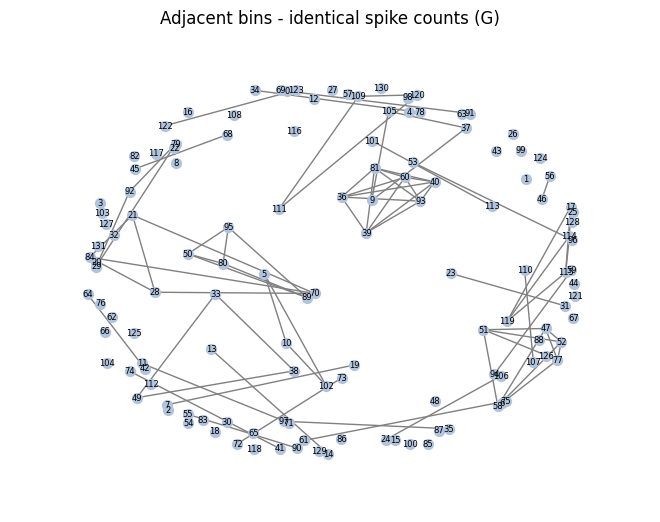

Visualizing: Adjacent bins - directed for succeeding time bins


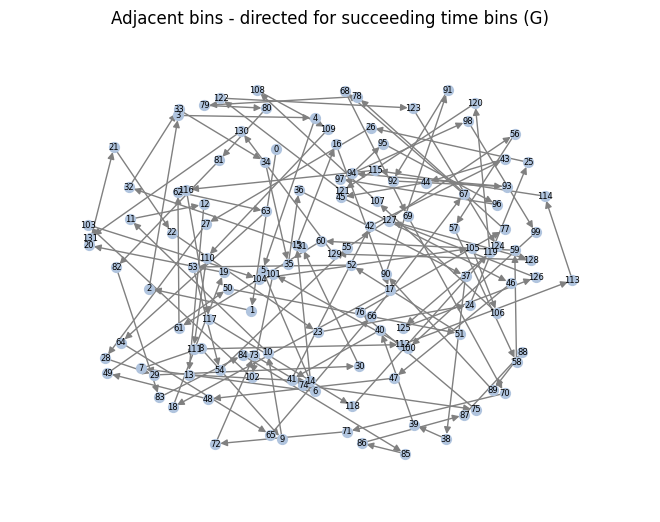

Visualizing: Adjacent bins - directed for increasing spike counts


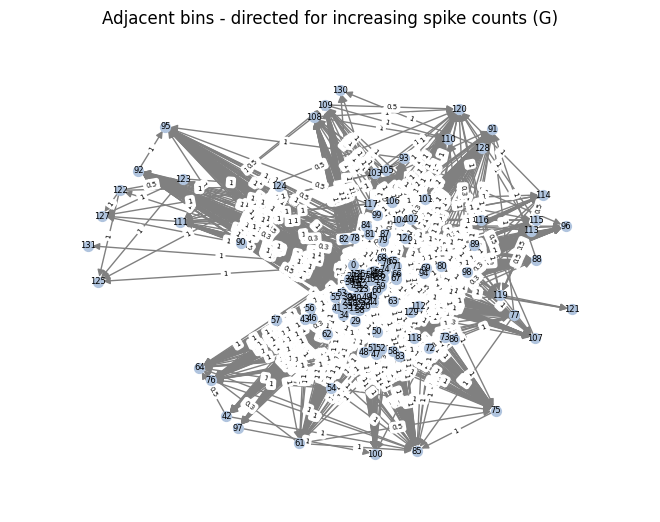

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


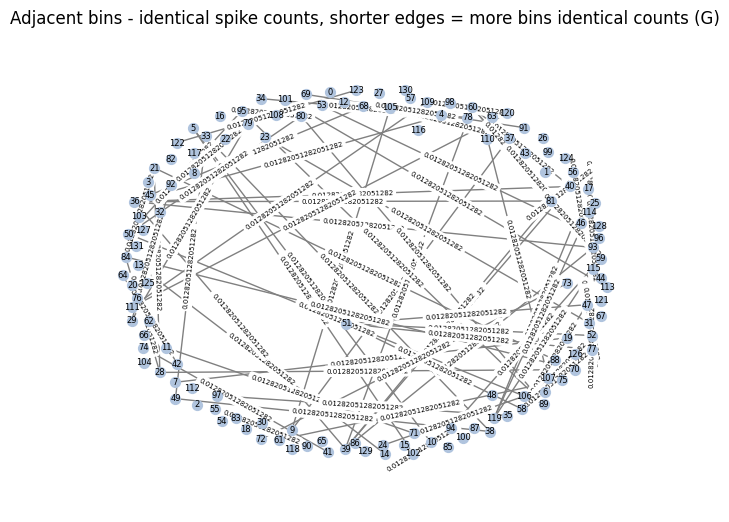

Visualizing graphs for letter H...

Visualizing: Adjacent bins - identical spike counts


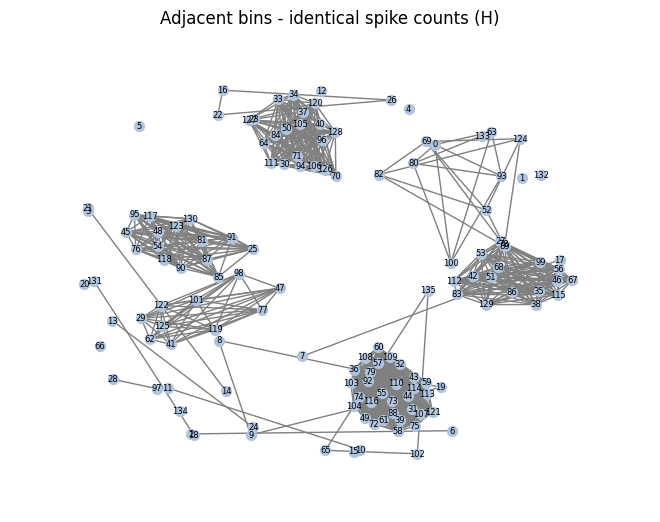

Visualizing: Adjacent bins - directed for succeeding time bins


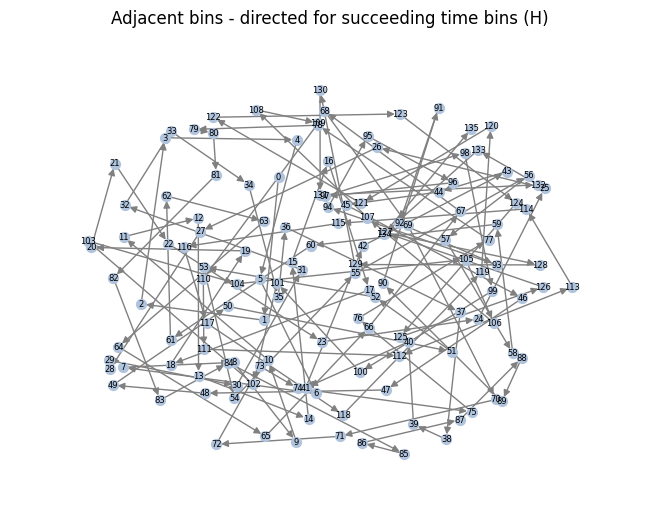

Visualizing: Adjacent bins - directed for increasing spike counts


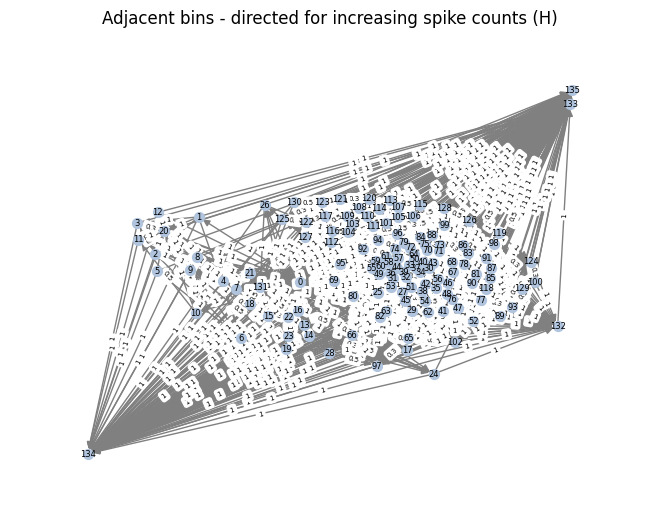

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


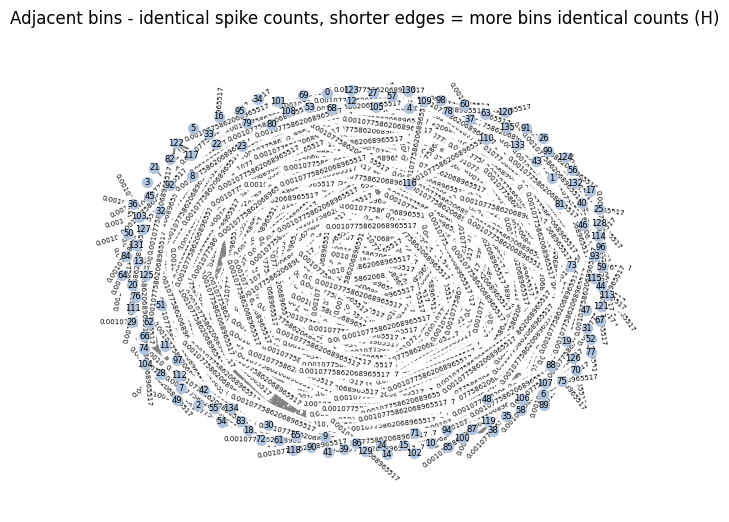

Visualizing graphs for letter I...

Visualizing: Adjacent bins - identical spike counts


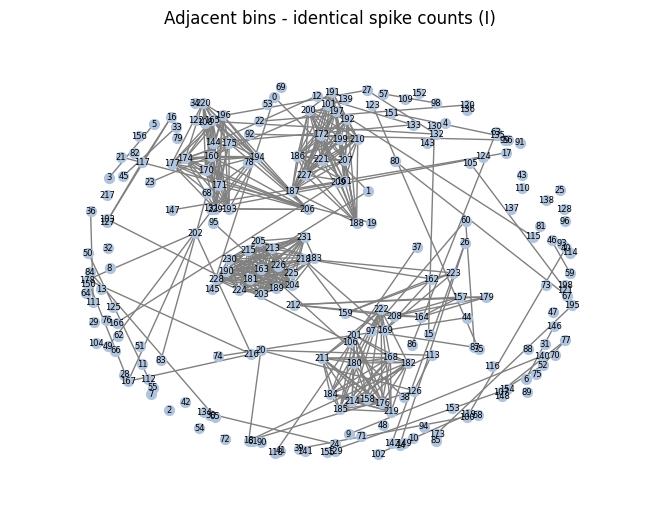

Visualizing: Adjacent bins - directed for succeeding time bins


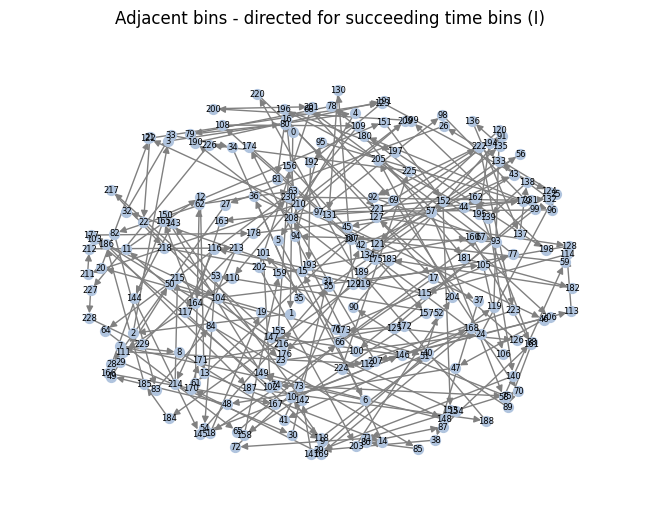

Visualizing: Adjacent bins - directed for increasing spike counts


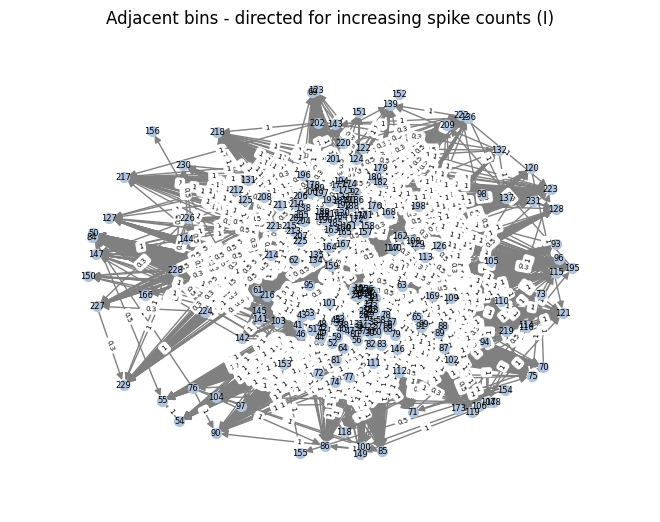

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


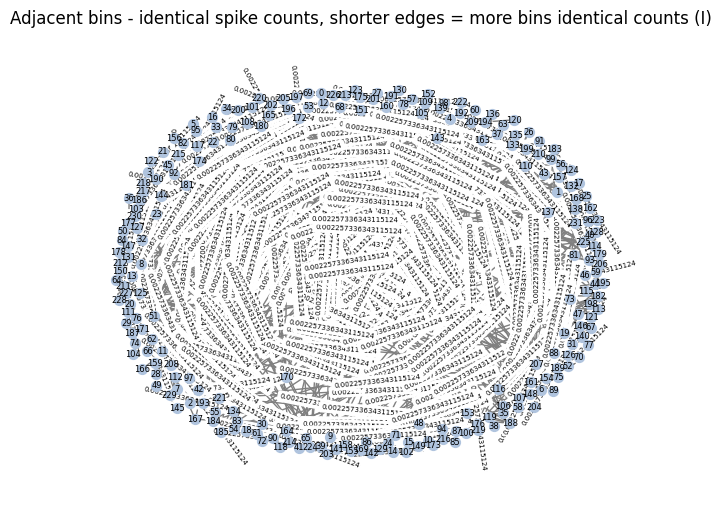

Visualizing graphs for letter J...

Visualizing: Adjacent bins - identical spike counts


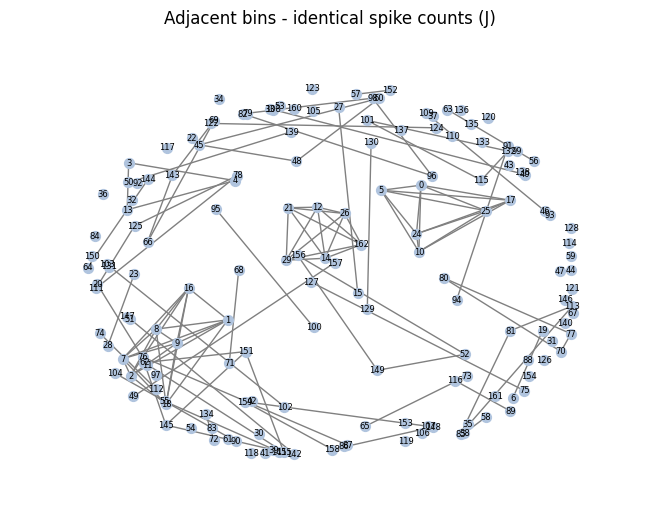

Visualizing: Adjacent bins - directed for succeeding time bins


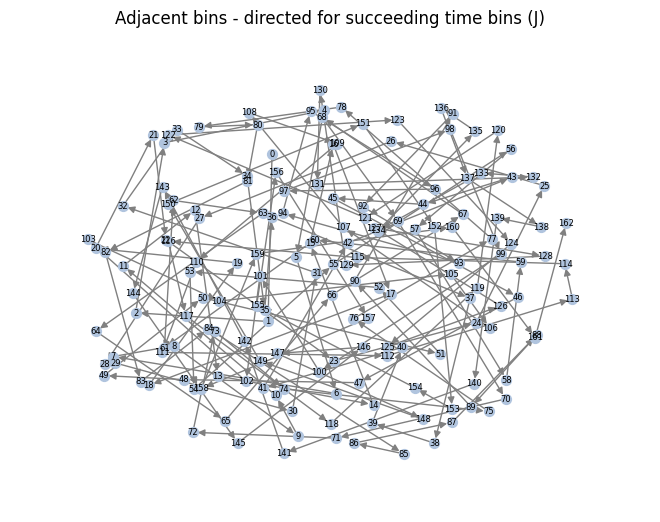

Visualizing: Adjacent bins - directed for increasing spike counts


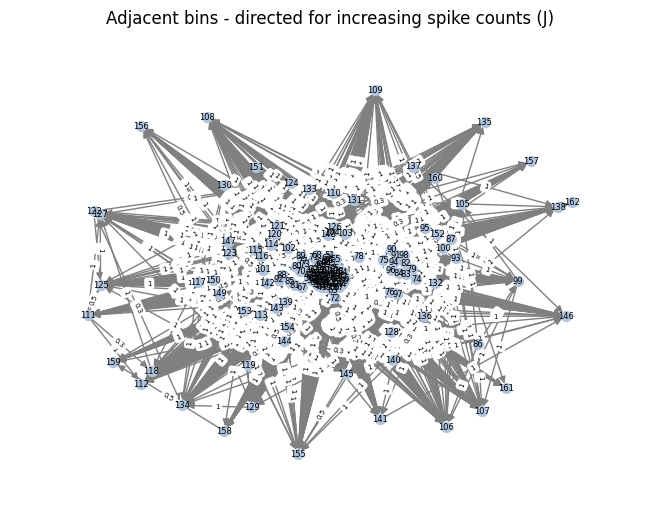

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


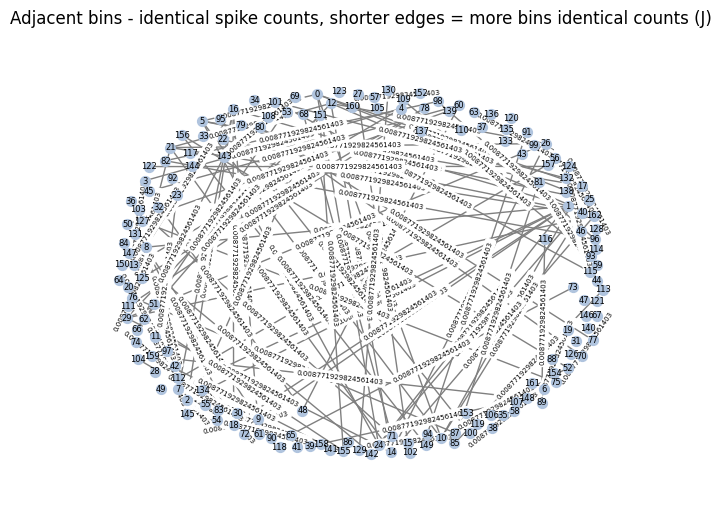

Visualizing graphs for letter Letter_10...

Visualizing: Adjacent bins - identical spike counts


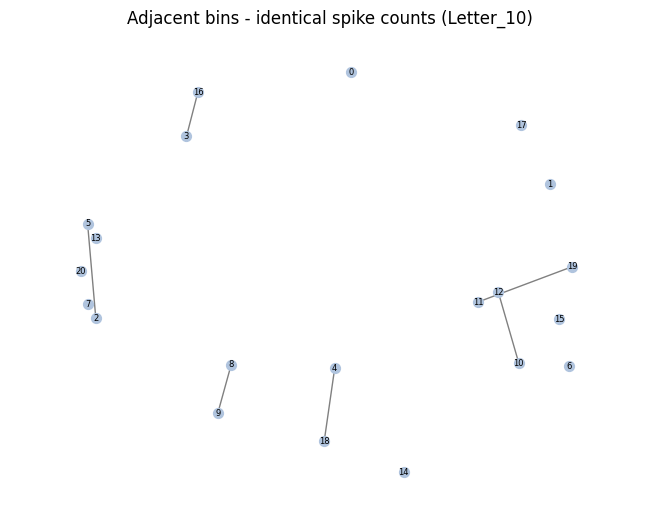

Visualizing: Adjacent bins - directed for succeeding time bins


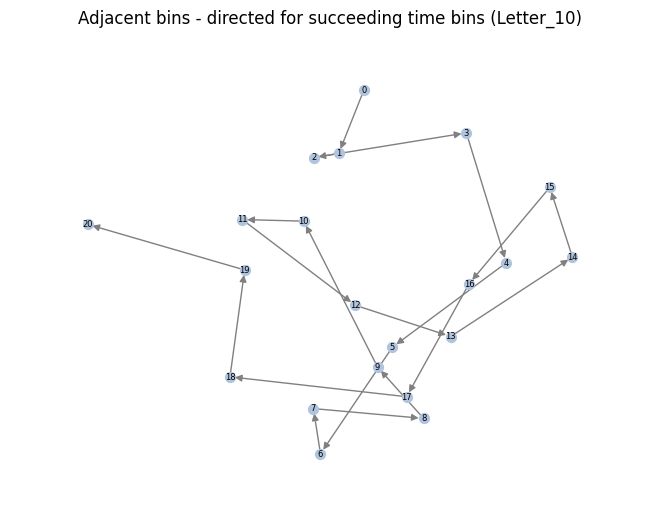

Visualizing: Adjacent bins - directed for increasing spike counts


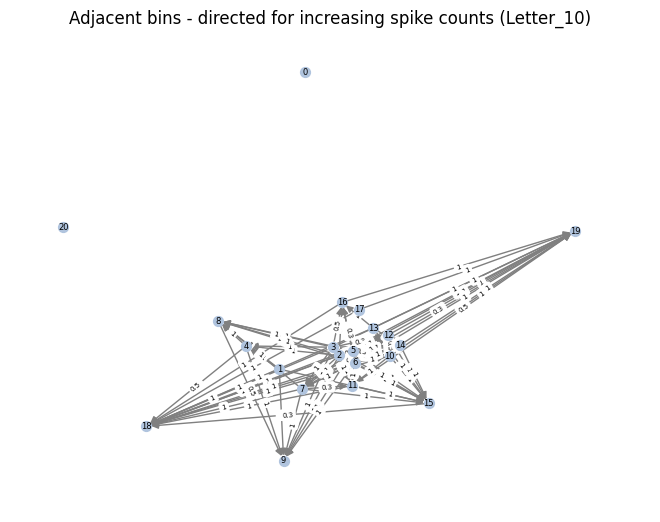

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


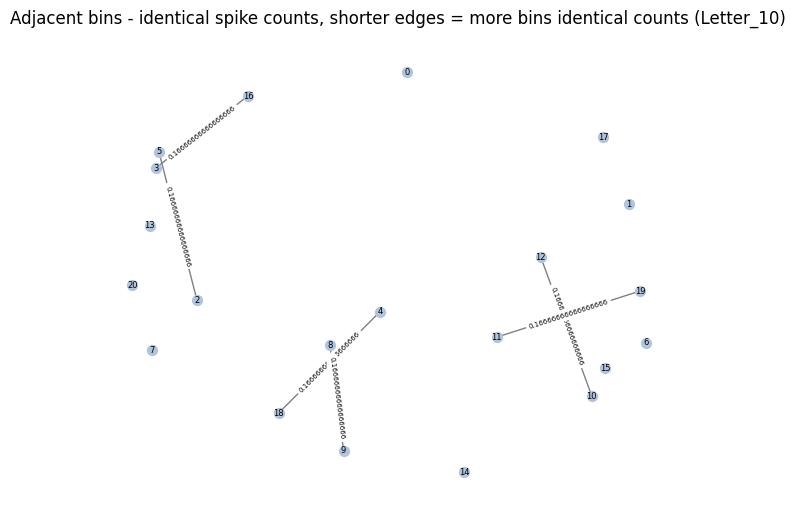

Visualizing graphs for letter Letter_11...

Visualizing: Adjacent bins - identical spike counts


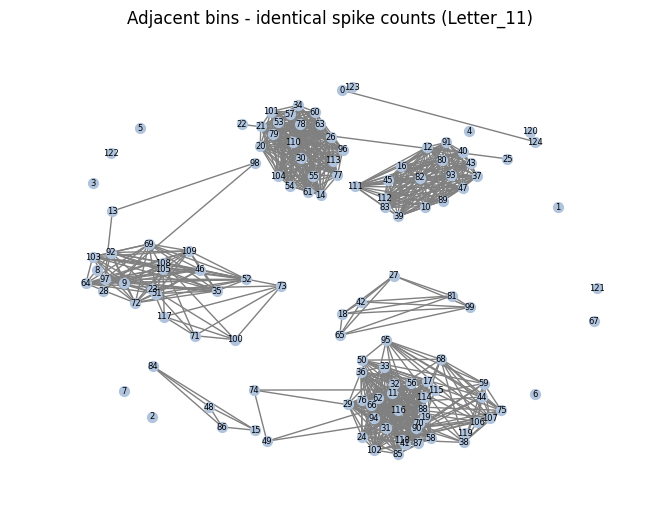

Visualizing: Adjacent bins - directed for succeeding time bins


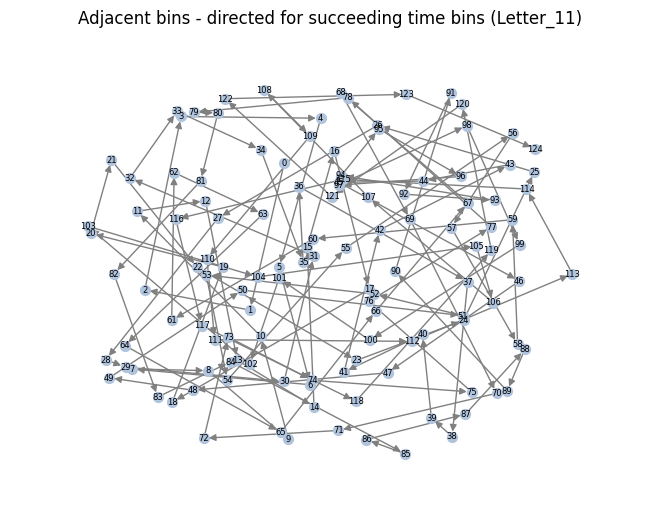

Visualizing: Adjacent bins - directed for increasing spike counts


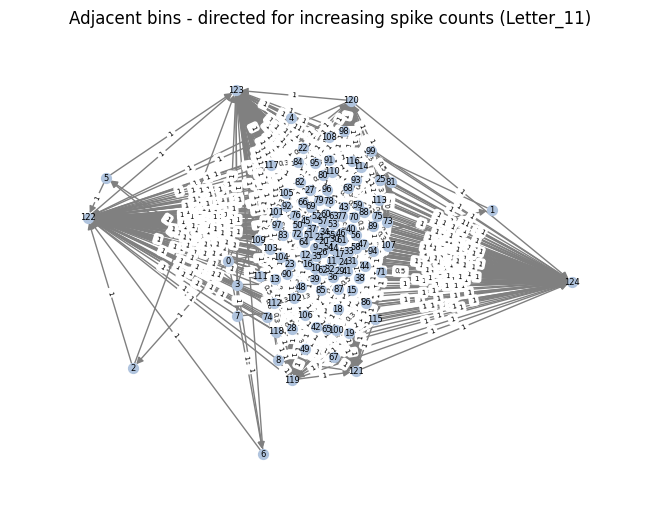

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


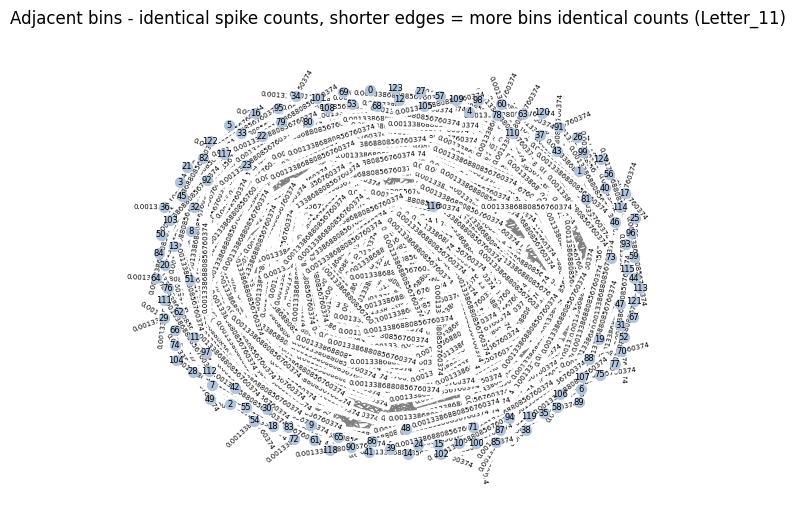

Visualizing graphs for letter Letter_12...

Visualizing: Adjacent bins - identical spike counts


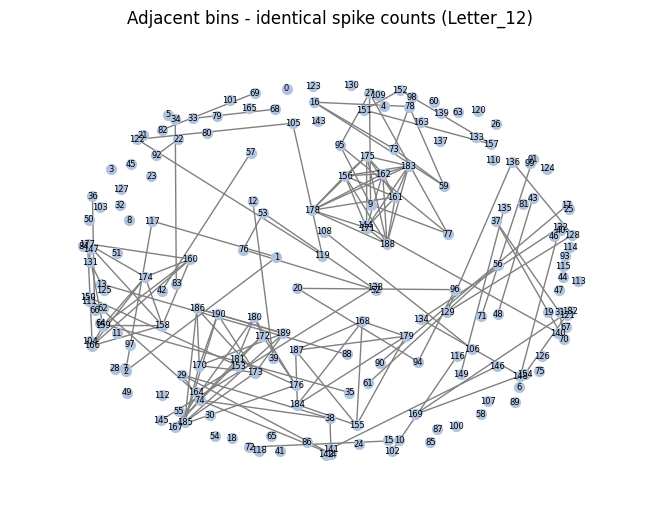

Visualizing: Adjacent bins - directed for succeeding time bins


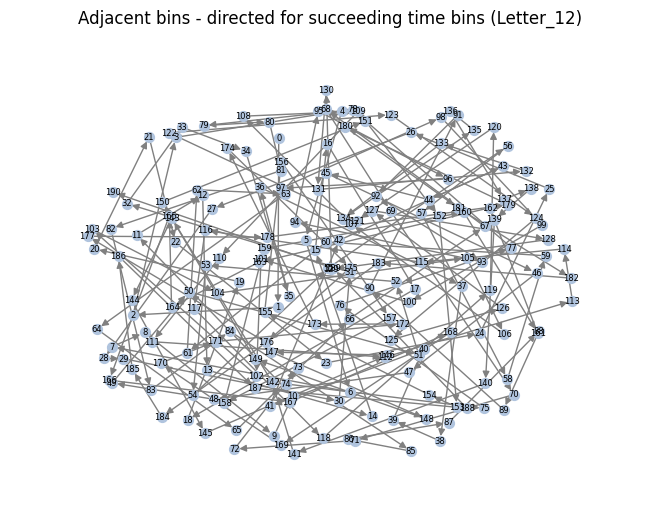

Visualizing: Adjacent bins - directed for increasing spike counts


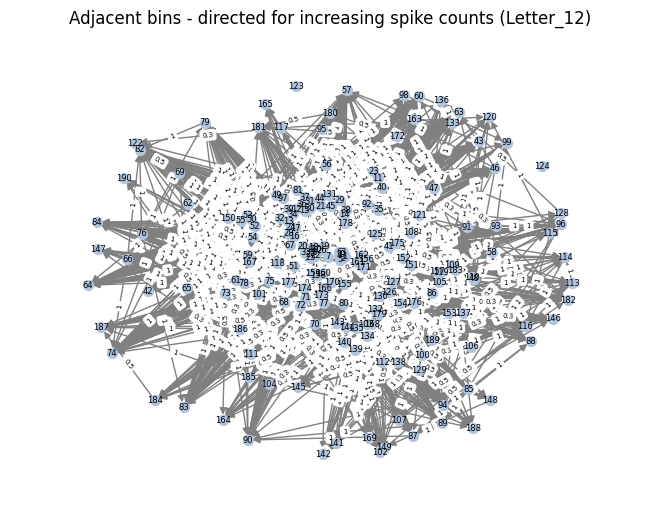

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


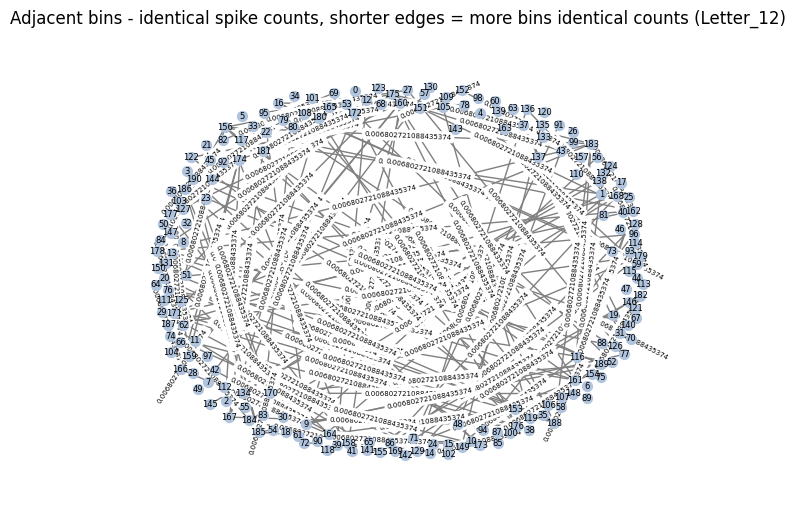

Visualizing graphs for letter Letter_13...

Visualizing: Adjacent bins - identical spike counts


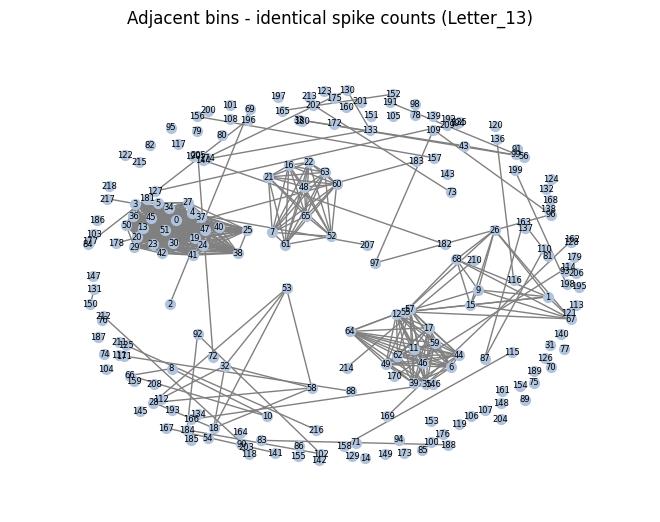

Visualizing: Adjacent bins - directed for succeeding time bins


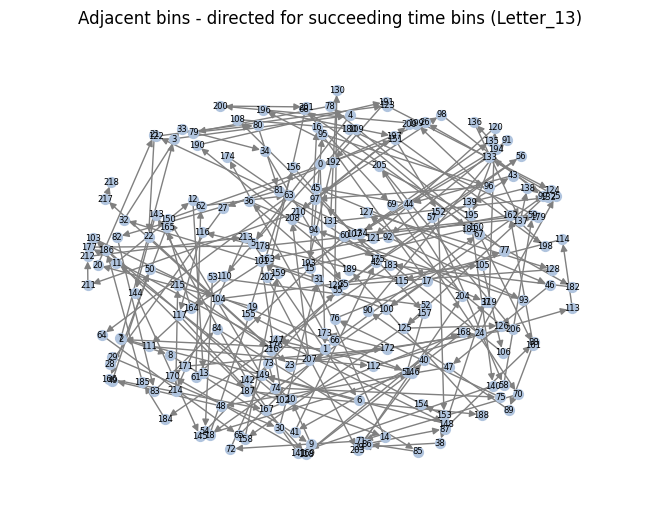

Visualizing: Adjacent bins - directed for increasing spike counts


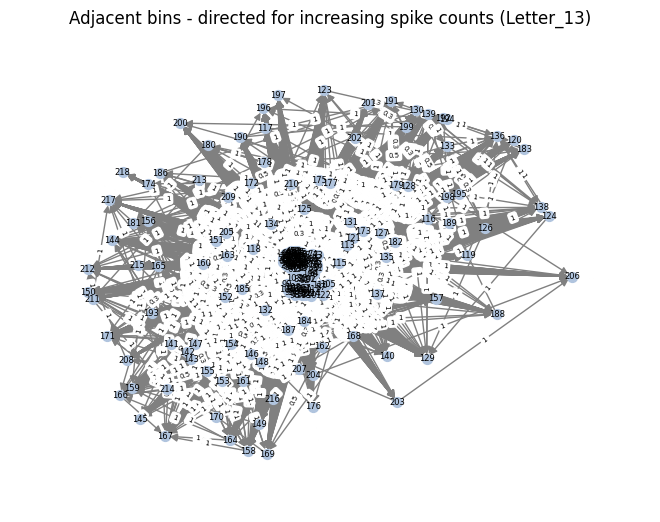

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


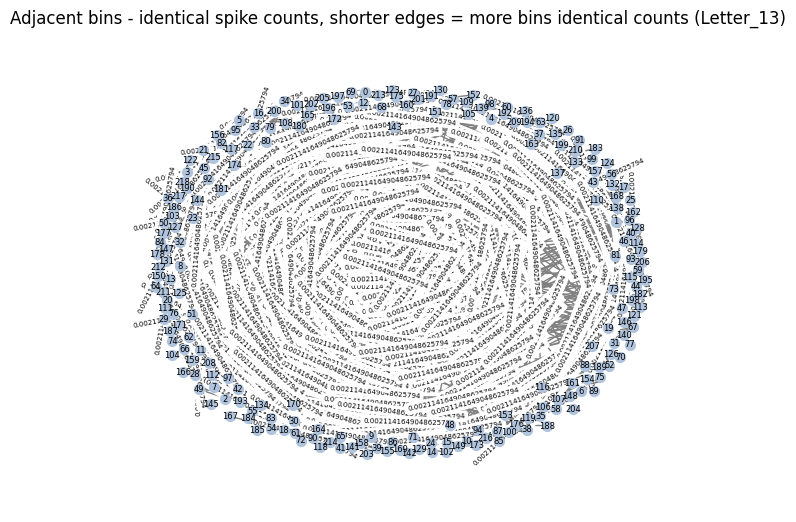

Visualizing graphs for letter Letter_14...

Visualizing: Adjacent bins - identical spike counts


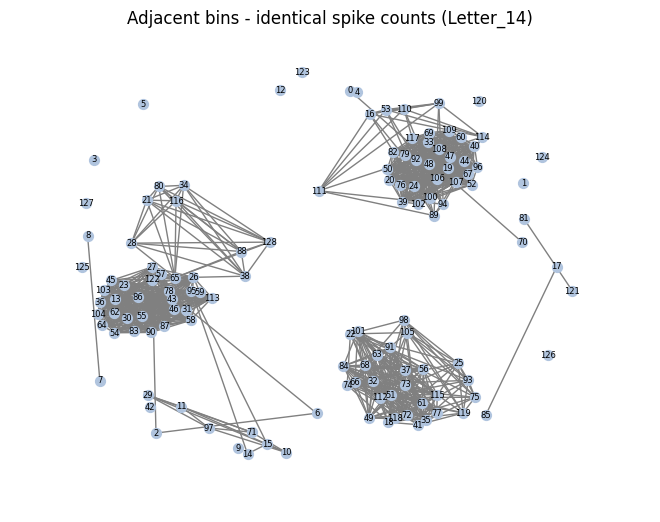

Visualizing: Adjacent bins - directed for succeeding time bins


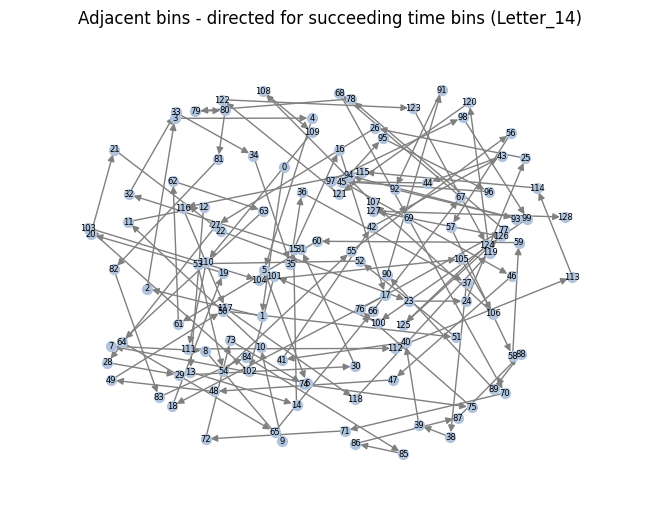

Visualizing: Adjacent bins - directed for increasing spike counts


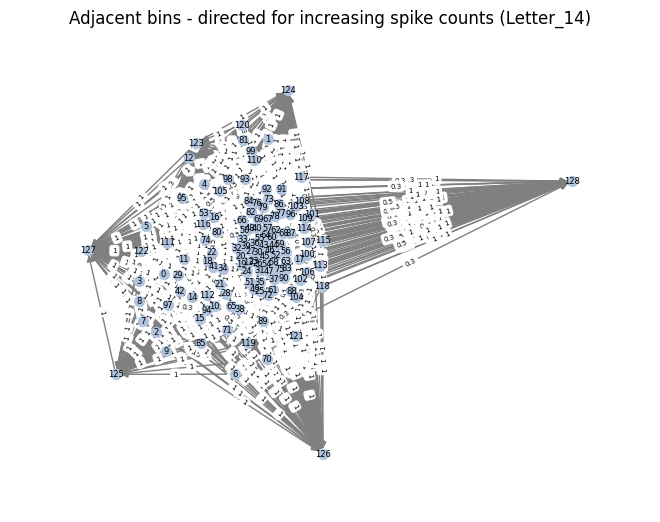

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


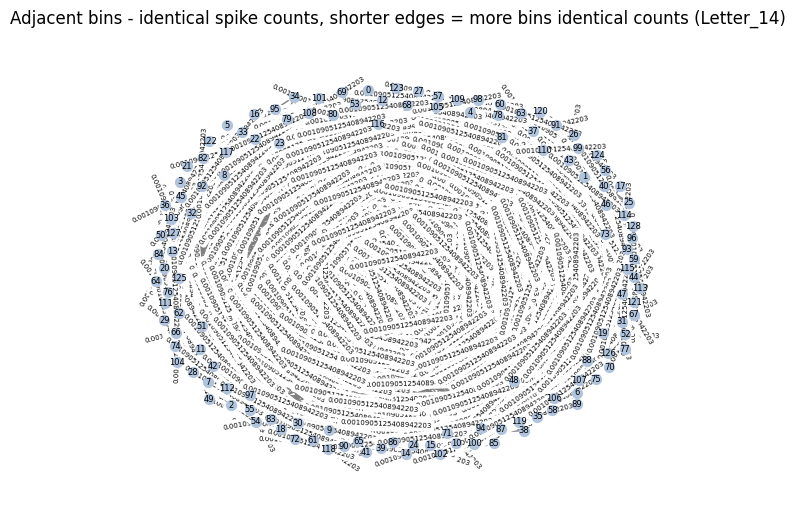

Visualizing graphs for letter Letter_15...

Visualizing: Adjacent bins - identical spike counts


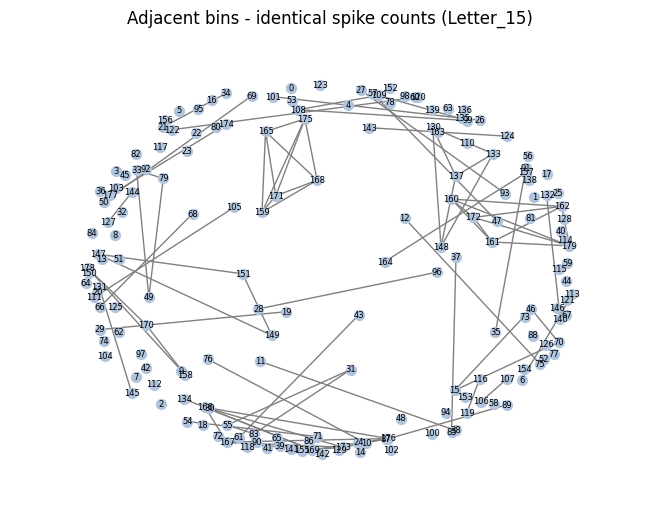

Visualizing: Adjacent bins - directed for succeeding time bins


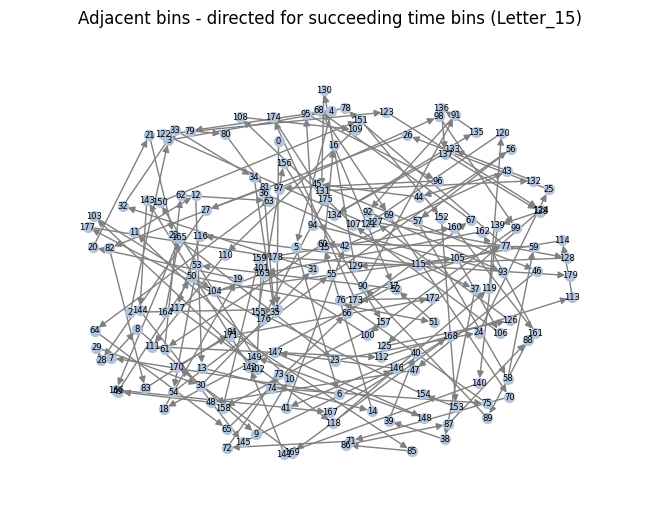

Visualizing: Adjacent bins - directed for increasing spike counts


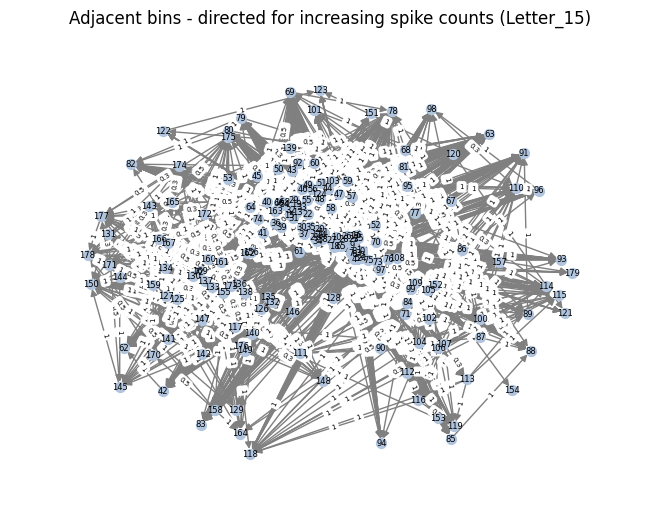

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


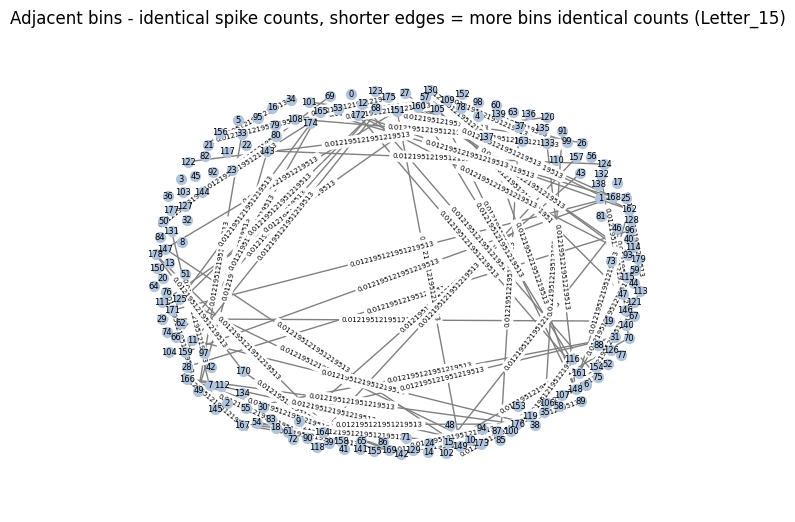

Visualizing graphs for letter Letter_16...

Visualizing: Adjacent bins - identical spike counts


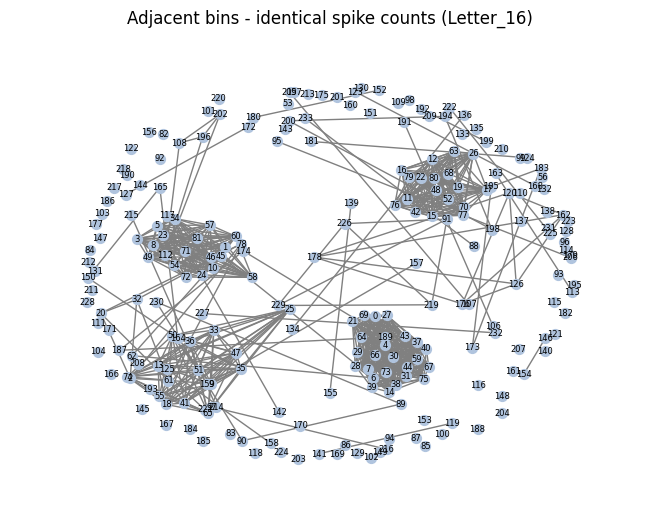

Visualizing: Adjacent bins - directed for succeeding time bins


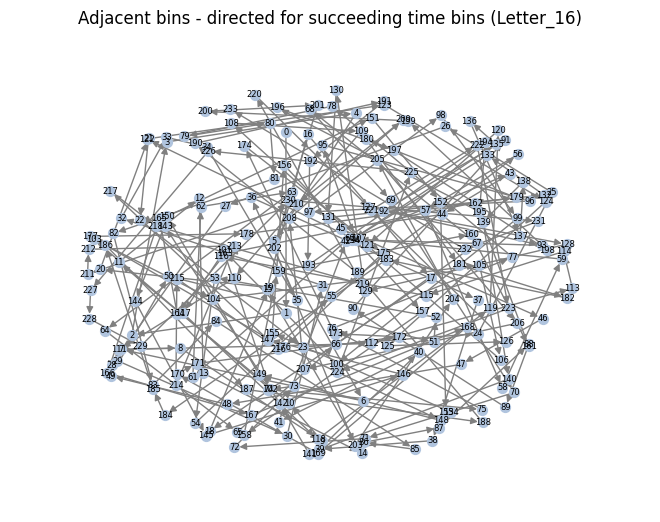

Visualizing: Adjacent bins - directed for increasing spike counts


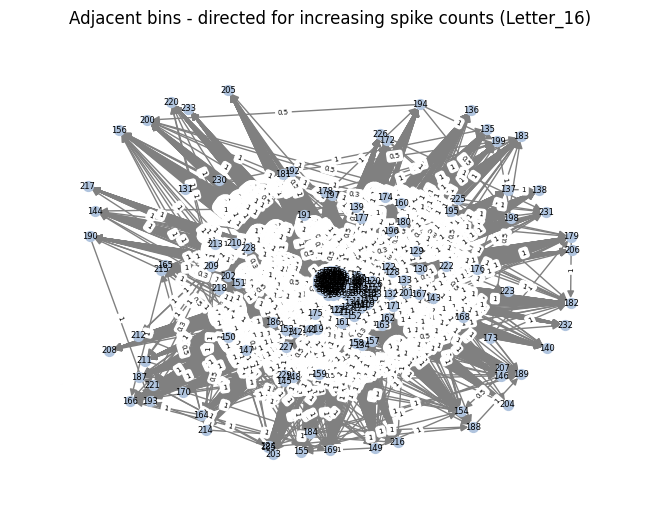

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


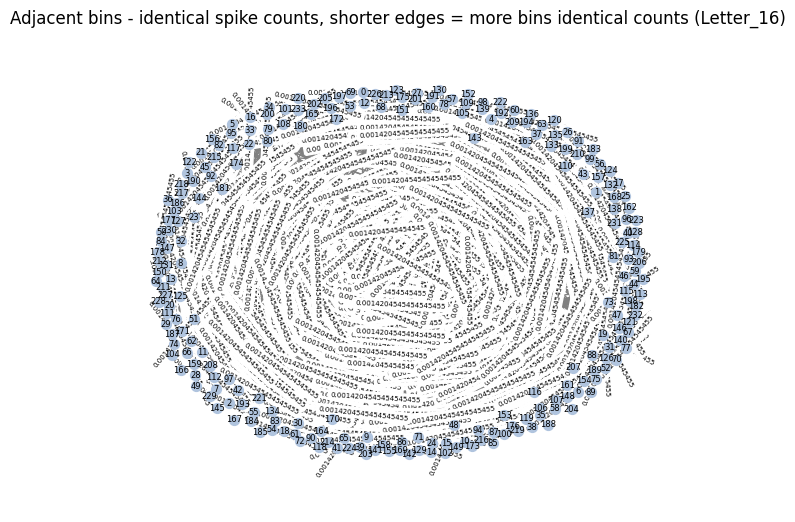

Visualizing graphs for letter Letter_17...

Visualizing: Adjacent bins - identical spike counts


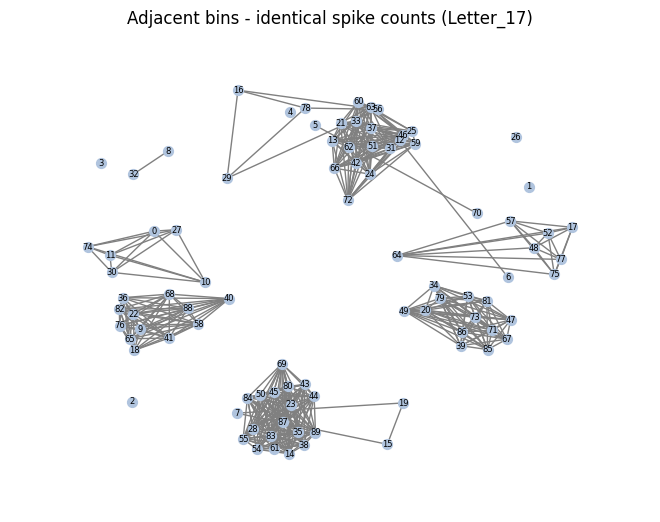

Visualizing: Adjacent bins - directed for succeeding time bins


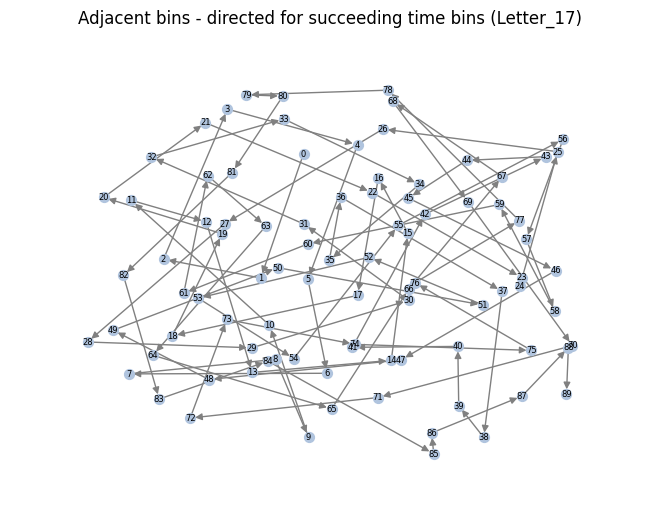

Visualizing: Adjacent bins - directed for increasing spike counts


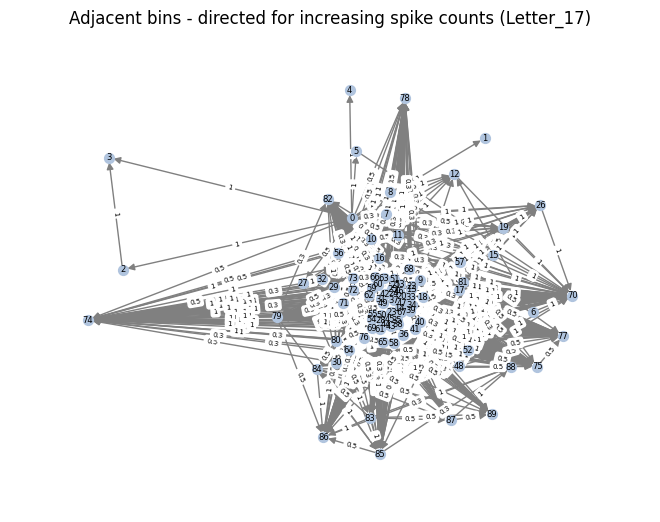

Visualizing: Adjacent bins - identical spike counts, shorter edges = more bins identical counts


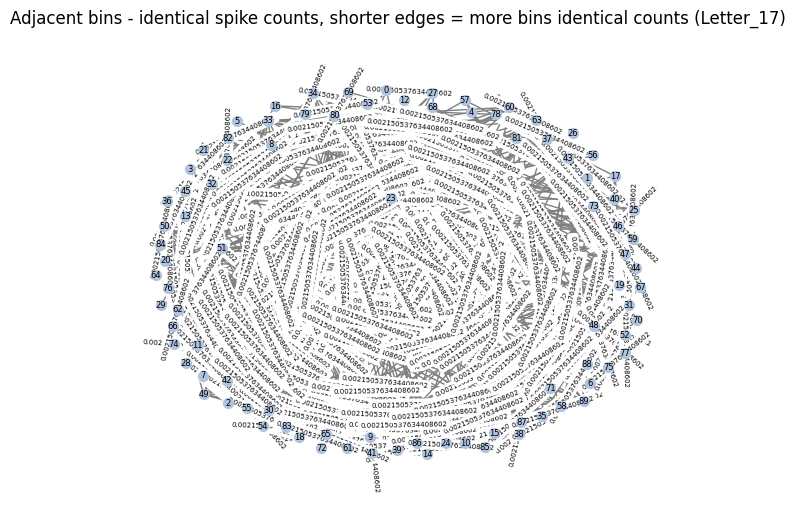

In [415]:
visualize_graphs(graph_by_letter)

Run the visualizer to visualize graphs and save them on system. 

In [416]:
'''Visualize Graphs'''

#graph_visualizer(graph_by_letter, letter = "A") #specific letter
#visualizer(graph_by_letter) #all letters

'Visualize Graphs'